In [1]:
#Python 3.11
#import package
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")


In [2]:
#Reading the CSV files
file_path_CM = 'UNICEF_Full_Data/CampaignMembers.csv'
file_path_C = 'UNICEF_Full_Data/Campaigns.csv'
file_path_D = 'UNICEF_Full_Data/Donations.csv'
file_path_R = 'UNICEF_Full_Data/RegularGiving.csv'
file_path_S = 'UNICEF_Full_Data/Supporters.csv'
file_path_SU = 'UNICEF_Full_Data/SupporterPostcodeUpdate.csv'

CampaignMembers_df = pd.read_csv(file_path_CM)
Campaigns_df = pd.read_csv(file_path_C)
Donations_df = pd.read_csv(file_path_D)
RegularGiving_df = pd.read_csv(file_path_R)
Supporters_df = pd.read_csv(file_path_S)
Supporters_updated_df = pd.read_csv(file_path_SU)


# 1 EDA

## 1.1 Basic Data View

In [5]:
#Check the data info
CampaignMembers_df.info()
Campaigns_df.info()
Donations_df.info()
RegularGiving_df.info()
Supporters_df.info()
Supporters_updated_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52099328 entries, 0 to 52099327
Data columns (total 4 columns):
 #   Column             Dtype 
---  ------             ----- 
 0   MemberID           object
 1   CampaignID         object
 2   SupporterID        object
 3   MemberCreatedDate  object
dtypes: object(4)
memory usage: 1.6+ GB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21943 entries, 0 to 21942
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   ParentID               12842 non-null  object
 1   Start_Date             21907 non-null  object
 2   Content_Thematic_Area  2923 non-null   object
 3   Content_Focus          21647 non-null  object
 4   Type                   21943 non-null  object
 5   Sub_Type               21942 non-null  object
 6   Activity               21923 non-null  object
 7   CampaignID             21943 non-null  object
 8   Solicitation_Channel   12388 non-nul

## 1.2 Data Fix

### 1.2.1 Data Fix for CampaignMembers

In [8]:
CampaignMembers_df.head(10)

,MemberID,CampaignID,SupporterID,MemberCreatedDate
0,00v2u000002BIqfAAG,7012u0000005CY6AAM,C-7600376076434,19/08/2020
1,00v2u000004UG4qAAG,7012u0000005RFwAAM,C-7600376076434,25/12/2020
2,00v2u0000067QjAAAU,7012u000000BxVCAA0,C-7600376076434,15/04/2021
3,00v2u000004qUrKAAU,7012u0000005j6wAAA,C-7600376076434,05/02/2021
4,00v2u000005ko2NAAQ,7012u000000BwfzAAC,C-7600376076434,08/03/2021
5,00v2u000004WY3EAAW,7012u0000005bmbAAA,C-7600376076434,18/01/2021
6,00v2u000002DijIAAS,7012u0000005FzgAAE,C-7600376076434,02/09/2020
7,00v2u000002CFu8AAG,7012u0000005DhzAAE,C-7600376076434,19/08/2020
8,00v2u000004QFrBAAW,7012u0000005OvEAAU,C-7600376076434,04/12/2020
9,00v2u000005831lAAA,7012u0000005p0vAAA,C-7600376076434,03/03/2021


In [9]:
#Check the null of the data
print("Null values per column:")
print(CampaignMembers_df.isnull().sum())

Null values per column:
MemberID             0
CampaignID           0
SupporterID          0
MemberCreatedDate    0
dtype: int64


In [10]:
# Check for duplicate MemberIDs
duplicate_ids = CampaignMembers_df['CampaignID'].value_counts()
duplicate_ids = duplicate_ids[duplicate_ids > 100]
print(duplicate_ids)

7018v0000009dUxAAI    261484
7018v0000009k6XAAQ    218138
7018v0000009jhrAAA    218077
701RG00000HTlmYYAT    217694
7018v0000009iWcAAI    217352
                       ...  
7012u00000055fpAAA       101
7012u00000055doAAA       101
701RG00000KXqcBYAT       101
7012u000000C0HhAAK       101
7012u0000005UZ4AAM       101
Name: CampaignID, Length: 2573, dtype: int64


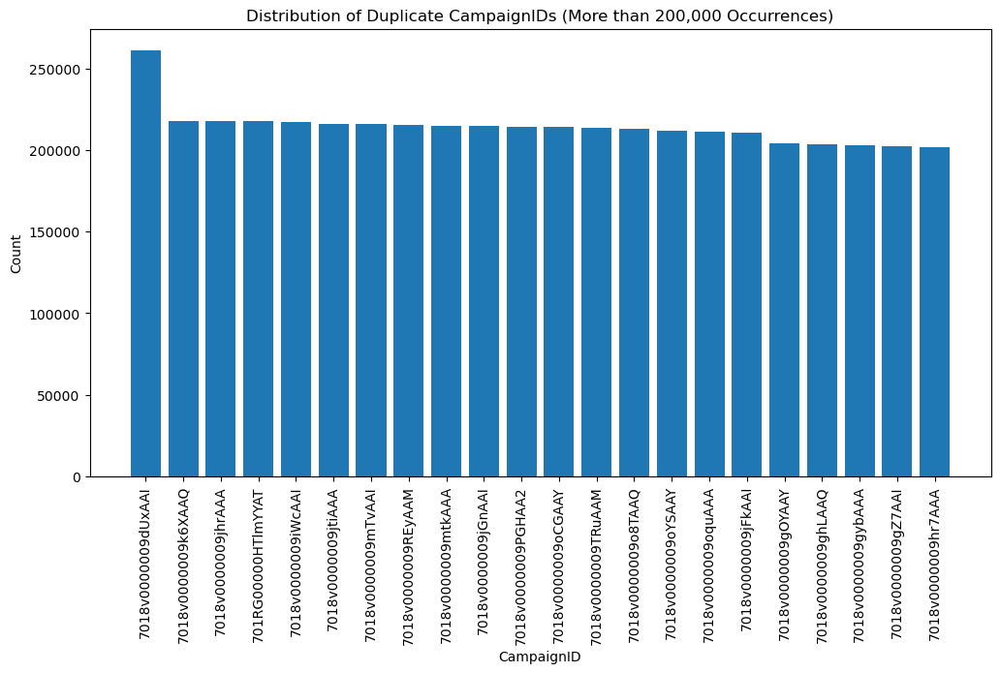

In [11]:
import matplotlib.pyplot as plt

# Check for duplicate MemberIDs
duplicate_ids = CampaignMembers_df['CampaignID'].value_counts()
duplicate_ids = duplicate_ids[duplicate_ids > 200000]

# Plot distribution of duplicate IDs
plt.figure(figsize=(12, 6))
plt.bar(duplicate_ids.index.astype(str), duplicate_ids.values)
plt.xlabel('CampaignID')
plt.ylabel('Count')
plt.title('Distribution of Duplicate CampaignIDs (More than 200,000 Occurrences)')
plt.xticks(rotation=90)
plt.show()


In [12]:
# Check for duplicate MemberIDs
duplicate_ids_supporter = CampaignMembers_df['SupporterID'].value_counts()
duplicate_ids_supporter = duplicate_ids_supporter[duplicate_ids_supporter > 450]
print(duplicate_ids)

7018v0000009dUxAAI    261484
7018v0000009k6XAAQ    218138
7018v0000009jhrAAA    218077
701RG00000HTlmYYAT    217694
7018v0000009iWcAAI    217352
7018v0000009jtiAAA    216286
7018v0000009mTvAAI    215950
7018v0000009REyAAM    215703
7018v0000009mtkAAA    215130
7018v0000009jGnAAI    215022
7018v0000009PGHAA2    214204
7018v0000009oCGAAY    214145
7018v0000009TRuAAM    213731
7018v0000009o8TAAQ    213319
7018v0000009oYSAAY    212272
7018v0000009oquAAA    211290
7018v0000009jFkAAI    210697
7018v0000009gOYAAY    204281
7018v0000009ghLAAQ    203769
7018v0000009gybAAA    203017
7018v0000009gZ7AAI    202608
7018v0000009hr7AAA    201731
Name: CampaignID, dtype: int64


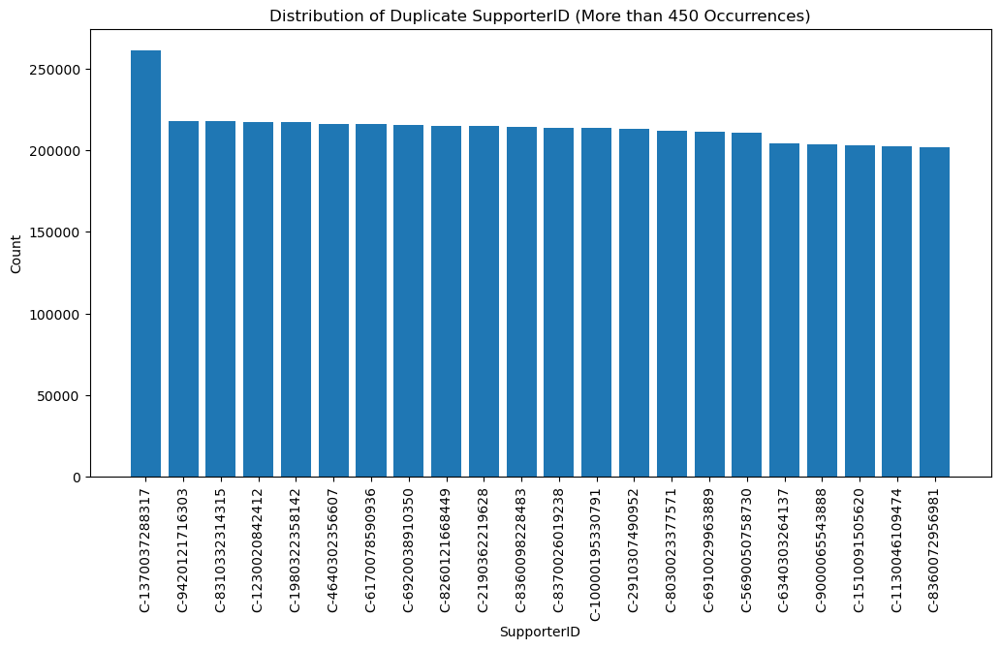

In [13]:
# Plot distribution of duplicate IDs
plt.figure(figsize=(12, 6))
plt.bar(duplicate_ids_supporter.index.astype(str), duplicate_ids.values)
plt.xlabel('SupporterID')
plt.ylabel('Count')
plt.title('Distribution of Duplicate SupporterID (More than 450 Occurrences)')
plt.xticks(rotation=90)
plt.show()


In [14]:
#By group the supporter ID can check each support join the different campaigin times
group_supporter = CampaignMembers_df.groupby('SupporterID')['CampaignID'].nunique()

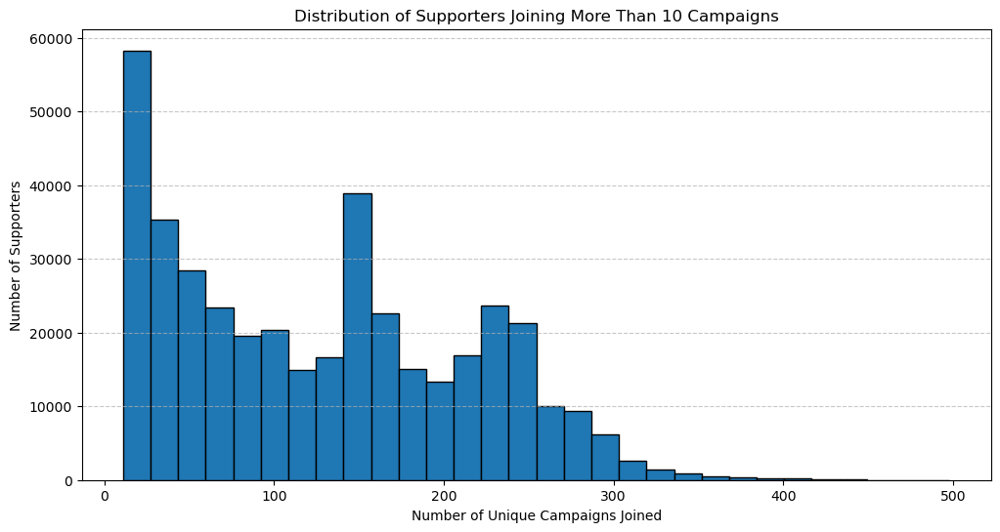

In [15]:
# Filter supporters who have joined more than 10 campaigns
filtered_supporters = group_supporter[group_supporter > 10]

# Plot distribution
plt.figure(figsize=(12, 6))
plt.hist(filtered_supporters, bins=30, edgecolor='black')
plt.xlabel('Number of Unique Campaigns Joined')
plt.ylabel('Number of Supporters')
plt.title('Distribution of Supporters Joining More Than 10 Campaigns')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [16]:
# Change the data type of MemberCreateDate from object to date
CampaignMembers_df['MemberCreatedDate'] = pd.to_datetime(
    CampaignMembers_df['MemberCreatedDate'], format="%d/%m/%Y", errors='coerce'
)

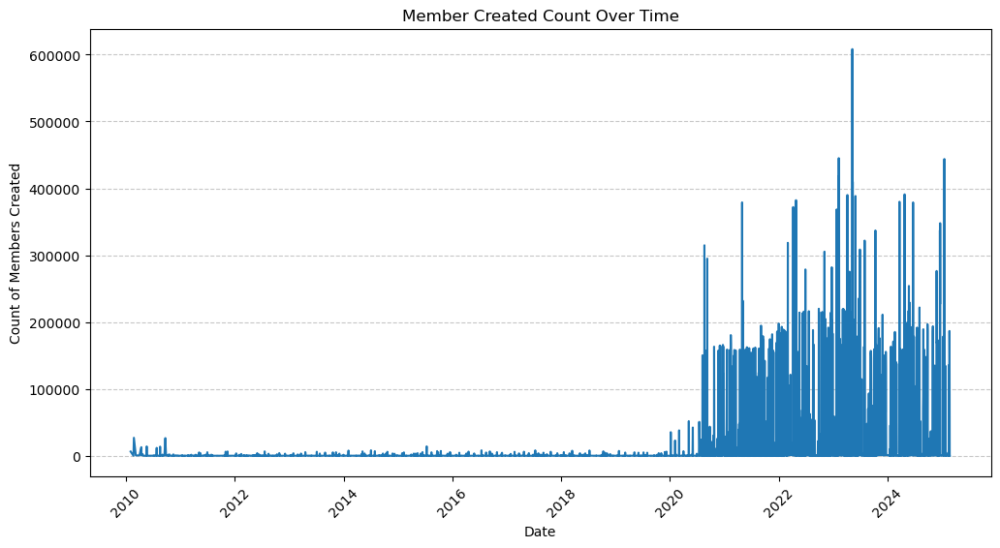

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Count occurrences of each date
date_counts = CampaignMembers_df['MemberCreatedDate'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
plt.plot(date_counts.index, date_counts.values,  linestyle='-')

# Format plot
plt.xlabel('Date')
plt.ylabel('Count of Members Created')
plt.title('Member Created Count Over Time')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

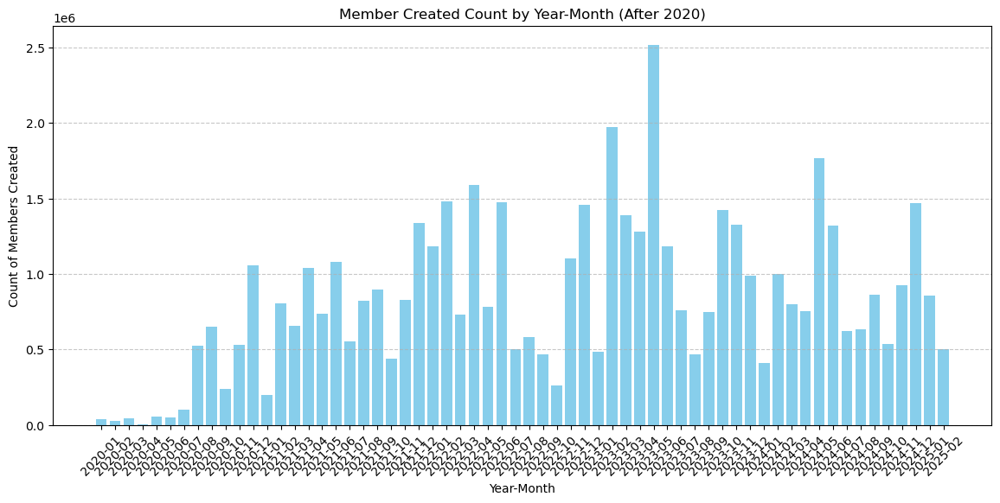

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming CampaignMembers_df is already loaded and contains 'MemberCreatedDate'
# Convert 'MemberCreatedDate' to datetime format
CampaignMembers_df['MemberCreatedDate'] = pd.to_datetime(CampaignMembers_df['MemberCreatedDate'])

# Filter data for dates after 2020
filtered_df = CampaignMembers_df[CampaignMembers_df['MemberCreatedDate'] >= '2020-01-01']

# Extract year and month
filtered_df['YearMonth'] = filtered_df['MemberCreatedDate'].dt.to_period('M')

# Count occurrences for each year-month combination
yearly_monthly_counts = filtered_df['YearMonth'].value_counts().sort_index()

# Convert period index to string for plotting
yearly_monthly_counts.index = yearly_monthly_counts.index.astype(str)

# Create a bar plot for year-month distribution
plt.figure(figsize=(14, 6))
plt.bar(yearly_monthly_counts.index, yearly_monthly_counts.values, color='skyblue')

# Format plot
plt.xlabel('Year-Month')
plt.ylabel('Count of Members Created')
plt.title('Member Created Count by Year-Month (After 2020)')
plt.xticks(rotation=45)  # Rotate for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


/Users/mingzengqin/Desktop/QBUS6600/Assignment/Member Created Count by Month.png

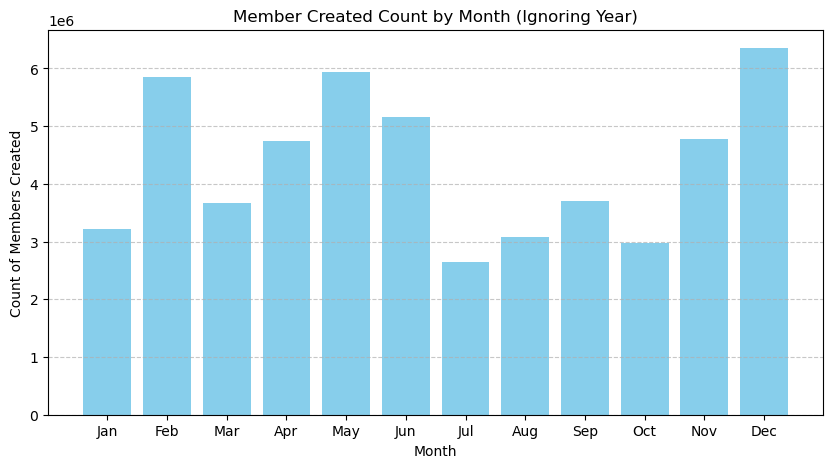

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import FileLink

# Convert 'MemberCreatedDate' to datetime format
CampaignMembers_df['MemberCreatedDate'] = pd.to_datetime(CampaignMembers_df['MemberCreatedDate'])

# Extract month from the date (ignoring the year)
CampaignMembers_df['Month'] = CampaignMembers_df['MemberCreatedDate'].dt.month

# Count occurrences for each month
monthly_counts = CampaignMembers_df['Month'].value_counts().sort_index()

# Create a bar plot for monthly distribution
plt.figure(figsize=(10, 5))
plt.bar(monthly_counts.index, monthly_counts.values, color='skyblue')

# Format plot
plt.xlabel('Month')
plt.ylabel('Count of Members Created')
plt.title('Member Created Count by Month (Ignoring Year)')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
display(FileLink("Member Created Count by Month.png"))

# Show the plot
plt.show()


### 1.2.2 Data Fix for Campaigns

In [21]:
Campaigns_df.head(10)

,ParentID,Start_Date,Content_Thematic_Area,Content_Focus,Type,Sub_Type,Activity,CampaignID,Solicitation_Channel,Appeal_Season
0,7012u00000051l2AAA,2020-01-01,NaN,NaN,Individual Giving,Event,NaN,7012u00000051lPAAQ,NaN,Null
1,7012u00000051lOAAQ,2020-01-01,NaN,NaN,Individual Giving,Community Fundraising,UA Led,7012u00000051vBAAQ,NaN,Null
2,7012u00000051lbAAA,2020-01-01,NaN,NaN,Individual Giving,Appeal,Quarterly,7012u00000051vLAAQ,EDM,Tax
3,7012u00000051ldAAA,2020-01-01,NaN,NaN,Individual Giving,Appeal,Quarterly,7012u00000051vOAAQ,DM,Autumn
4,7012u00000051ldAAA,2020-01-01,NaN,NaN,Individual Giving,Appeal,Quarterly,7012u00000051vPAAQ,EDM,Autumn
5,7012u00000051vDAAQ,2020-01-01,NaN,NaN,Individual Giving,Global Parent,Acquisition,7012u00000051wGAAQ,Telemarketing,Null
6,7012u00000051vLAAQ,2020-01-01,NaN,NaN,Individual Giving,Appeal,Quarterly,7012u00000051wNAAQ,EDM,Tax
7,7012u00000051vGAAQ,2020-01-01,NaN,NaN,Individual Giving,Global Parent,Upgrade,7012u00000051wTAAQ,Unsolicited,Null
8,7012u00000051vOAAQ,2020-01-01,NaN,NaN,Individual Giving,Appeal,Quarterly,7012u00000051wVAAQ,DM,Autumn
9,7012u00000051vOAAQ,2020-01-01,NaN,NaN,Individual Giving,Appeal,Quarterly,7012u00000051wWAAQ,DM,Autumn


In [22]:
Campaigns_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21943 entries, 0 to 21942
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   ParentID               12842 non-null  object
 1   Start_Date             21907 non-null  object
 2   Content_Thematic_Area  2923 non-null   object
 3   Content_Focus          21647 non-null  object
 4   Type                   21943 non-null  object
 5   Sub_Type               21942 non-null  object
 6   Activity               21923 non-null  object
 7   CampaignID             21943 non-null  object
 8   Solicitation_Channel   12388 non-null  object
 9   Appeal_Season          21943 non-null  object
dtypes: object(10)
memory usage: 1.7+ MB


In [23]:
# data type change
Campaigns_df['Start_Date'] = pd.to_datetime(Campaigns_df['Start_Date'])

In [24]:
# fill NA for date
def fill_missing_dates(group):
    if group.isnull().all():  
        return group
    mode_value = group.mode()  
    if not mode_value.empty:
        return group.fillna(mode_value[0])  # if ther is mode in group, use this mode
    else:
        return group.fillna(group.median())  # else using median to fill

Campaigns_df['Start_Date']= Campaigns_df['Start_Date'].fillna(Campaigns_df['Start_Date'].median())


In [25]:
filiter = Campaigns_df[Campaigns_df['CampaignID'] == '7018v0000009REyAAM']
filiter.shape

(1, 10)

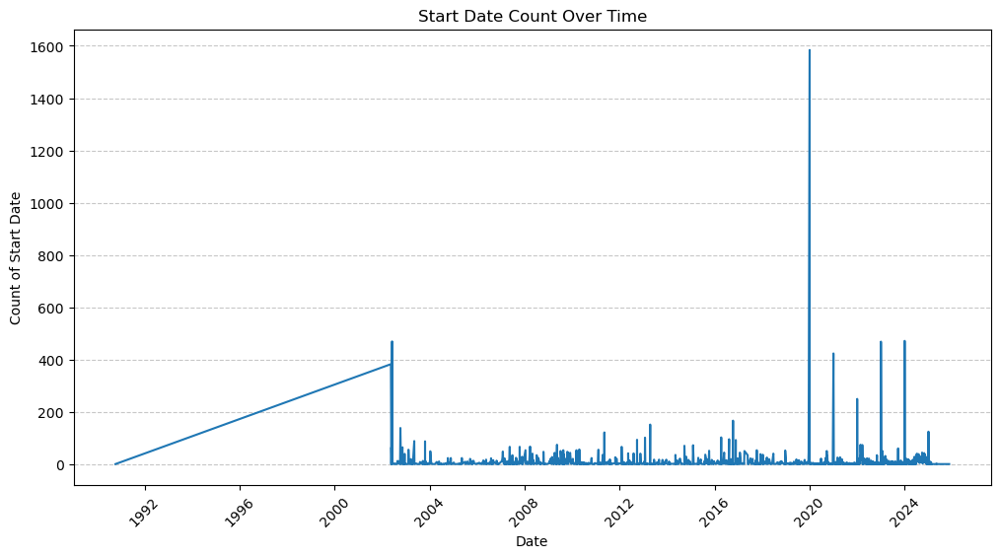

In [26]:
# Count occurrences of each date
start_date_counts = Campaigns_df['Start_Date'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
plt.plot(start_date_counts.index, start_date_counts.values,  linestyle='-')

# Format plot
plt.xlabel('Date')
plt.ylabel('Count of Start Date')
plt.title('Start Date Count Over Time')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [27]:
Campaigns_df = Campaigns_df[Campaigns_df['Start_Date'] >= '2000-01-01']

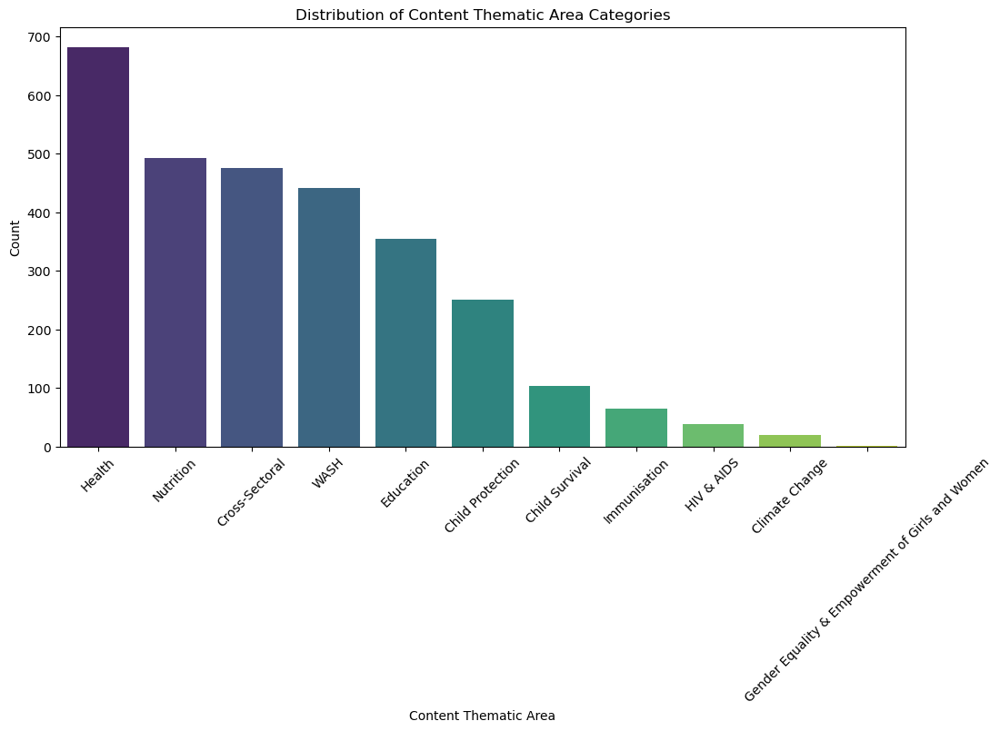

In [28]:
# count Content_Thematic_Area 
category_counts = Campaigns_df['Content_Thematic_Area'].value_counts()

# Visualization
plt.figure(figsize=(12, 6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette="viridis")
plt.xticks(rotation=45)
plt.xlabel("Content Thematic Area")
plt.ylabel("Count")
plt.title("Distribution of Content Thematic Area Categories")
plt.show()

In [29]:
# fill na of content thematic
def fill_content_thematic(group):
    if group.isnull().all():  # in the group `CampaignID` is NaN
        return group.fillna("Not Specific")  # fill Not Specifit
    mode_value = group.mode()  #find the mode in group
    if not mode_value.empty:
        return group.fillna(mode_value[0])  # if there is mode, fill mode
    else:
        return group.fillna("Not Specific")  # if there is no mode, fill Not Specific

Campaigns_df['Content_Thematic_Area'] = Campaigns_df.groupby('CampaignID')['Content_Thematic_Area'].transform(fill_content_thematic)

Campaigns_df['Content_Thematic_Area'] = Campaigns_df['Content_Thematic_Area'].fillna("Not Specific")


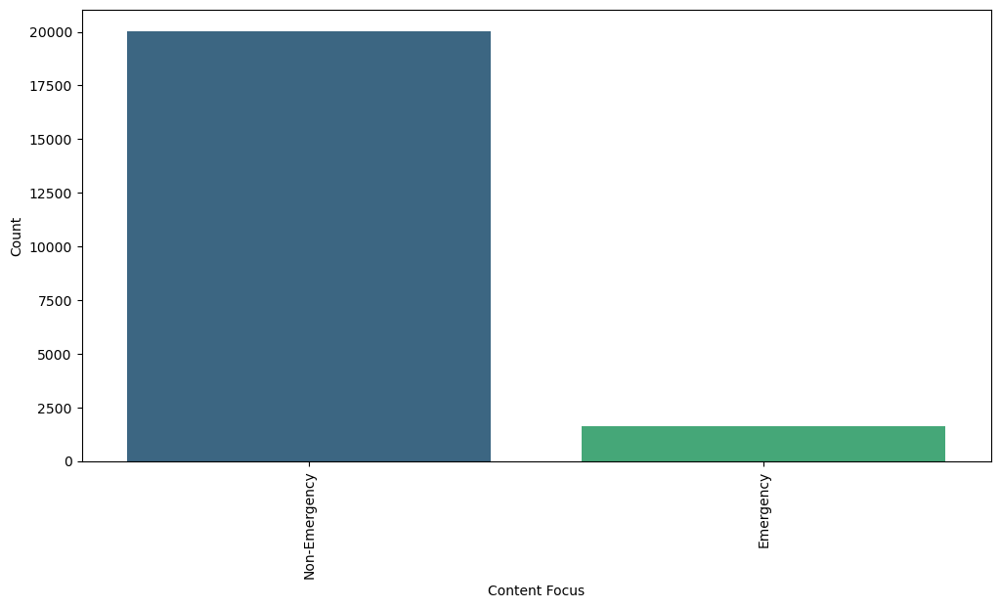

In [30]:
# count Content_Thematic_Area 
category_counts = Campaigns_df['Content_Focus'].value_counts()

# visualization
plt.figure(figsize=(12, 6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette="viridis")
plt.xticks(rotation=90)
plt.xlabel("Content Focus")
plt.ylabel("Count")
plt.show()

In [31]:
Campaigns_df['Content_Focus'] = Campaigns_df['Content_Focus'].fillna("Non-Emergency")

In [32]:
# Fill missing values in 'Sub_Type' and 'Activity' with their respective mode (most frequent value)
Campaigns_df['Sub_Type'] = Campaigns_df['Sub_Type'].fillna(Campaigns_df['Sub_Type'].mode()[0])
Campaigns_df['Activity'] = Campaigns_df['Activity'].fillna(Campaigns_df['Activity'].mode()[0])

# Fill missing values in 'Solicitation_Channel' with "Not Specific Channel"
Campaigns_df['Solicitation_Channel'] = Campaigns_df['Solicitation_Channel'].fillna("Not Specific Channel")


In [33]:
Campaigns_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21942 entries, 0 to 21942
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ParentID               12841 non-null  object        
 1   Start_Date             21942 non-null  datetime64[ns]
 2   Content_Thematic_Area  21942 non-null  object        
 3   Content_Focus          21942 non-null  object        
 4   Type                   21942 non-null  object        
 5   Sub_Type               21942 non-null  object        
 6   Activity               21942 non-null  object        
 7   CampaignID             21942 non-null  object        
 8   Solicitation_Channel   21942 non-null  object        
 9   Appeal_Season          21942 non-null  object        
dtypes: datetime64[ns](1), object(9)
memory usage: 1.8+ MB


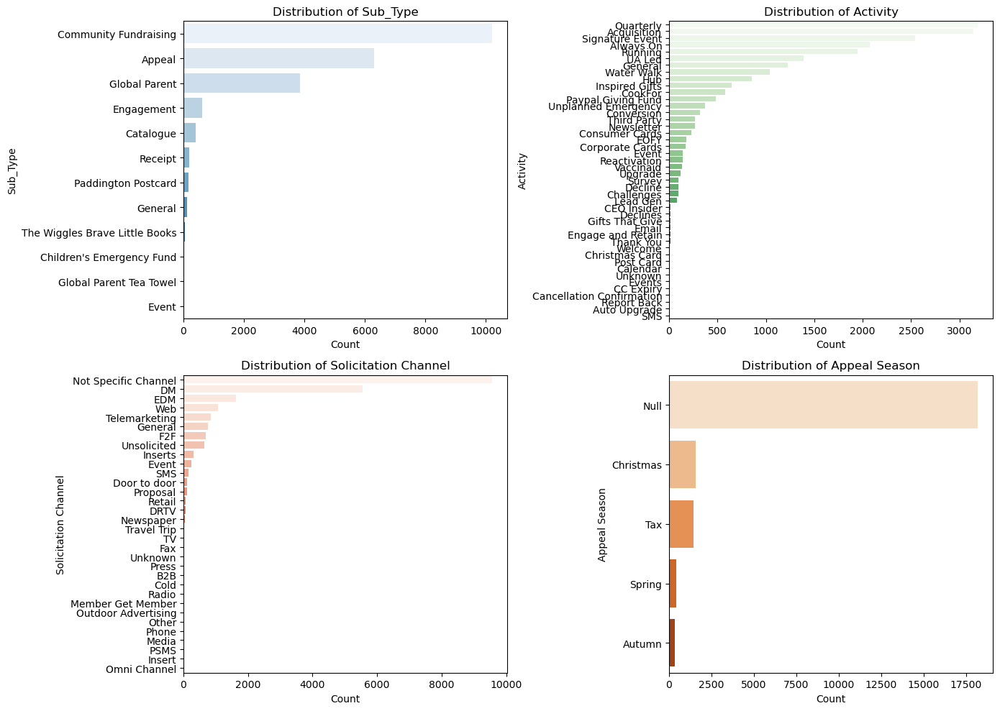

In [34]:
# Create a 2x2 subplot layout
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 'Sub_Type' distribution
sns.countplot(y=Campaigns_df['Sub_Type'], order=Campaigns_df['Sub_Type'].value_counts().index, palette="Blues", ax=axes[0, 0])
axes[0, 0].set_title("Distribution of Sub_Type")
axes[0, 0].set_xlabel("Count")
axes[0, 0].set_ylabel("Sub_Type")

# Plot 'Activity' distribution
sns.countplot(y=Campaigns_df['Activity'], order=Campaigns_df['Activity'].value_counts().index, palette="Greens", ax=axes[0, 1])
axes[0, 1].set_title("Distribution of Activity")
axes[0, 1].set_xlabel("Count")
axes[0, 1].set_ylabel("Activity")

# Plot 'Solicitation_Channel' distribution
sns.countplot(y=Campaigns_df['Solicitation_Channel'], order=Campaigns_df['Solicitation_Channel'].value_counts().index, palette="Reds", ax=axes[1, 0])
axes[1, 0].set_title("Distribution of Solicitation Channel")
axes[1, 0].set_xlabel("Count")
axes[1, 0].set_ylabel("Solicitation Channel")

# Plot 'Appeal_Season' distribution
sns.countplot(y=Campaigns_df['Appeal_Season'], order=Campaigns_df['Appeal_Season'].value_counts().index, palette="Oranges", ax=axes[1, 1])
axes[1, 1].set_title("Distribution of Appeal Season")
axes[1, 1].set_xlabel("Count")
axes[1, 1].set_ylabel("Appeal Season")

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

### 1.2.3 Data Fix for Donations

In [36]:
Donations_df.head()

,Payment_Type,Donation_Channel,SupporterID,Gift_Date,DonationID,CampaignID,RGID,Gift_Amount
0,Other,NaN,C-8390062979965,1993-12-02,0062u000009RhlYAAS,7012u00000057PeAAI,NaN,14.0
1,Credit Card,Web,C-3790398596568,2021-05-03,0062u00000C4ru2AAB,7012u000000Bxv0AAC,NaN,76.3
2,Paypal - ANZ,Web,C-6020209832747,2023-02-21,0068v000002ay3aAAA,7018v0000009gOOAAY,NaN,21.0
3,Other,Web,C-3080456410533,2020-06-17,0062u000009PmkwAAC,7012u00000056MOAAY,NaN,10.5
4,Cash,Web,C-9600343495465,2014-12-24,0062u000009VOqAAAW,7012u0000005687AAA,NaN,49.0


In [37]:
Donations_df['Gift_Date'] = pd.to_datetime(Donations_df['Gift_Date'])

In [38]:
print("Null values per column:")
print(Donations_df.isnull().sum())

Null values per column:
Payment_Type              3
Donation_Channel     642133
SupporterID               0
Gift_Date                 0
DonationID                0
CampaignID                0
RGID                1231172
Gift_Amount               0
dtype: int64


In [39]:
Payment_Type_category_counts = Donations_df['Payment_Type'].value_counts()
print(Payment_Type_category_counts)

Credit Card                 4086595
Direct Debit                1084017
Other                        554826
Bank Account                 344731
Cheque                       150339
Cash                          76683
Paypal - CBA                  39171
Stripe                        32670
Paypal - Digital              31134
Paypal - ANZ                  11913
Stripe - Crowdfunder           4917
Direct Deposit - ANZ           4365
Shopify - CBA                  4234
Paypal                         1721
Stripe - Google Pay            1542
Paypal - Finance               1526
Stripe - Apple Pay             1452
Stripe  - Crowdfunder          1345
Paypal - Accounts              1174
Direct Deposit - CBA            246
Direct Deposit                   44
Stripe - Link                    41
EverydayHero                     33
Direct Deposit - CBA USD          7
Adjustment                        1
JustGiving                        1
Name: Payment_Type, dtype: int64


In [40]:
# Define a function to categorize payment types
def clean_payment_type(payment):
    """Categorizes similar payment types into broader categories."""
    payment = str(payment).lower()  # Convert to lowercase for uniformity
    
    if "paypal" in payment:
        return "Paypal"
    elif "direct debit" in payment:
        return "Direct Debit"
    elif "direct deposit" in payment:
        return "Direct Deposit"
    elif "stripe" in payment:
        return "Stripe"
    elif "credit card" in payment:
        return "Credit Card"
    elif "bank account" in payment:
        return "Bank Account"
    elif "cheque" in payment:
        return "Cheque"
    elif "cash" in payment:
        return "Cash"
    elif "shopify" in payment:
        return "Shopify"
    elif "justgiving" in payment:
        return "Other"
    elif "everydayhero" in payment:
        return "Other"
    elif "adjustment" in payment:
        return "Other"
    else:
        return "Other"

# Apply the function to the 'Payment_Type' column
Donations_df['Payment_Type'] = Donations_df['Payment_Type'].apply(clean_payment_type)
# Fill na with other
Donations_df['Payment_Type'] = Donations_df['Payment_Type'].fillna("Other")
# Display the cleaned payment type counts
Donations_df['Payment_Type'].value_counts()



Credit Card       4086595
Direct Debit      1084017
Other              554864
Bank Account       344731
Cheque             150339
Paypal              86639
Cash                76683
Stripe              41967
Direct Deposit       4662
Shopify              4234
Name: Payment_Type, dtype: int64

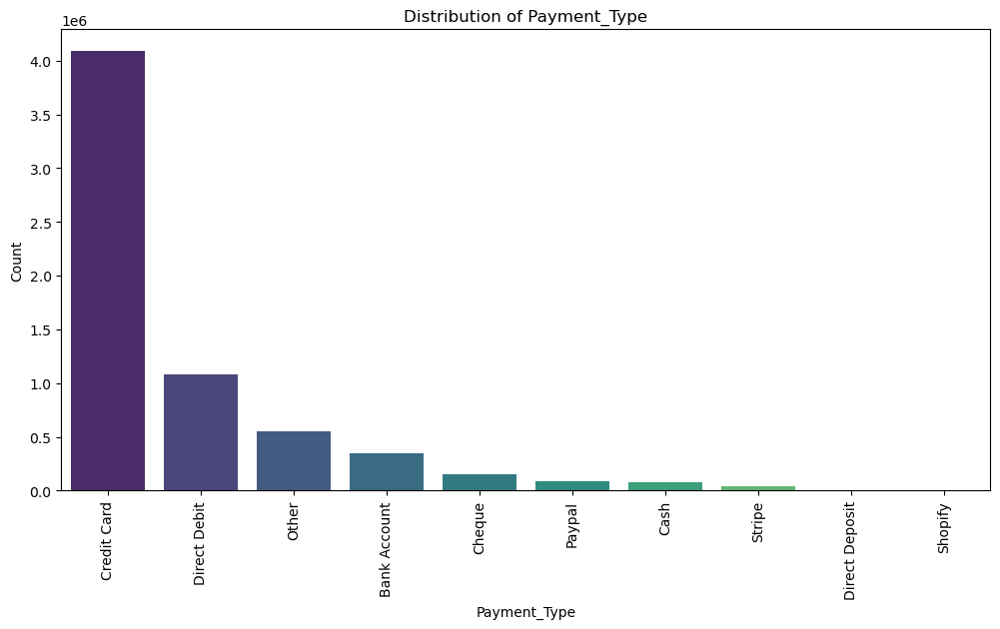

In [41]:
# Compute payment type counts again
payment_counts = Donations_df['Payment_Type'].value_counts()

plt.figure(figsize=(12, 6))
sns.barplot(x=payment_counts.index, y=payment_counts.values, palette="viridis")
plt.xticks(rotation=90)
plt.xlabel("Payment_Type")
plt.ylabel("Count")
plt.title("Distribution of Payment_Type")
plt.show()

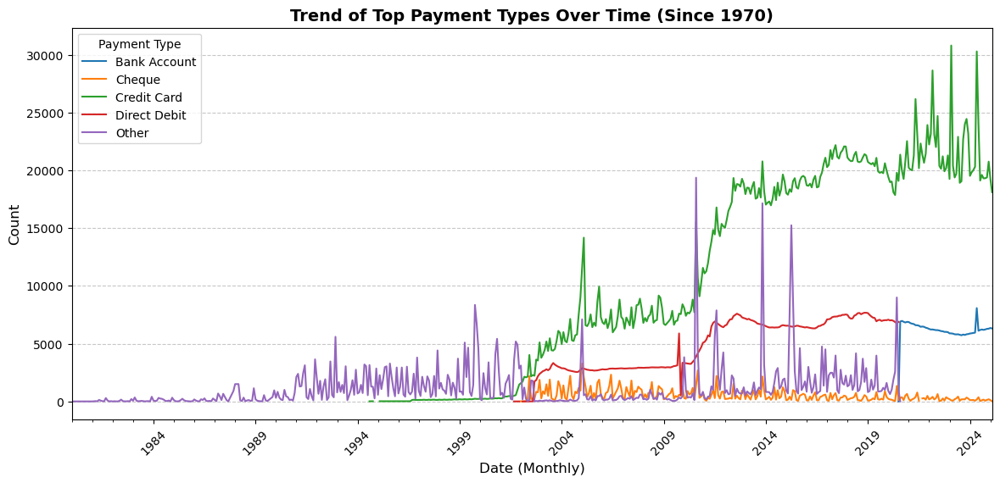

In [42]:
# Filter dataset to include only records from 1970 onwards
filtered_data = Donations_df[Donations_df['Gift_Date'] >= "1970-01-01"].copy()

# Select top 5 payment types based on count
payment_counts = filtered_data['Payment_Type'].value_counts()
top_payment_types = payment_counts.head(5).index

# Filter data to only include top payment types
filtered_data = filtered_data[filtered_data['Payment_Type'].isin(top_payment_types)]

# Convert 'Gift_Date' to datetime if not already
filtered_data['Gift_Date'] = pd.to_datetime(filtered_data['Gift_Date'])

# Aggregate counts over time (monthly)
trend_data = filtered_data.groupby([filtered_data['Gift_Date'].dt.to_period("M"), 'Payment_Type']).size().unstack()

# Plot trend over time
plt.figure(figsize=(14, 6))
trend_data.plot(kind='line',  ax=plt.gca())

# Formatting
plt.xlabel("Date (Monthly)", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Trend of Top Payment Types Over Time (Since 1970)", fontsize=14, fontweight="bold")
plt.xticks(rotation=45)
plt.legend(title="Payment Type")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


In [43]:
Donations_df['Donation_Channel'] = Donations_df['Donation_Channel'].fillna("Unknown")

In [44]:
Donation_Channel_category_counts = Donations_df['Donation_Channel'].value_counts()
print(Donation_Channel_category_counts)

Recurring Run            4540398
Web                      1085057
Unknown                   642133
Mail                       91029
Raisely                    24960
General                    13328
Crowdfunder                 6262
Funraisin                   6038
Shopify                     5994
General Journal             4171
Phone                       4151
Third Party                 3957
Grassrootz                  2279
Web - Express               1706
Mondial                      845
PayPal Giving Fund           807
Pareto                       696
Precision Connect            311
EverydayHero                 238
MyCause                      163
Quick Donate                  75
Email                         38
Community Fundraising         36
Shout For Good                26
Workplace Giving              22
Change for Good                9
The Giving Block               1
Everyday Hero                  1
Name: Donation_Channel, dtype: int64


In [45]:
# Define a threshold for categorizing small donation channels as "Other"
threshold = 5000  # Channels with counts below this will be grouped as "Other"

# Create a mapping function
def categorize_channel(channel):
    if Donation_Channel_category_counts[channel] < threshold:
        return "Other"
    else:
        return channel

# Apply the function to reclassify small donation channels
Donations_df['Donation_Channel'] = Donations_df['Donation_Channel'].apply(categorize_channel)

# Display the updated category counts
donation_channel_counts = Donations_df['Donation_Channel'].value_counts()
donation_channel_counts


Recurring Run    4540398
Web              1085057
Unknown           642133
Mail               91029
Raisely            24960
Other              19532
General            13328
Crowdfunder         6262
Funraisin           6038
Shopify             5994
Name: Donation_Channel, dtype: int64

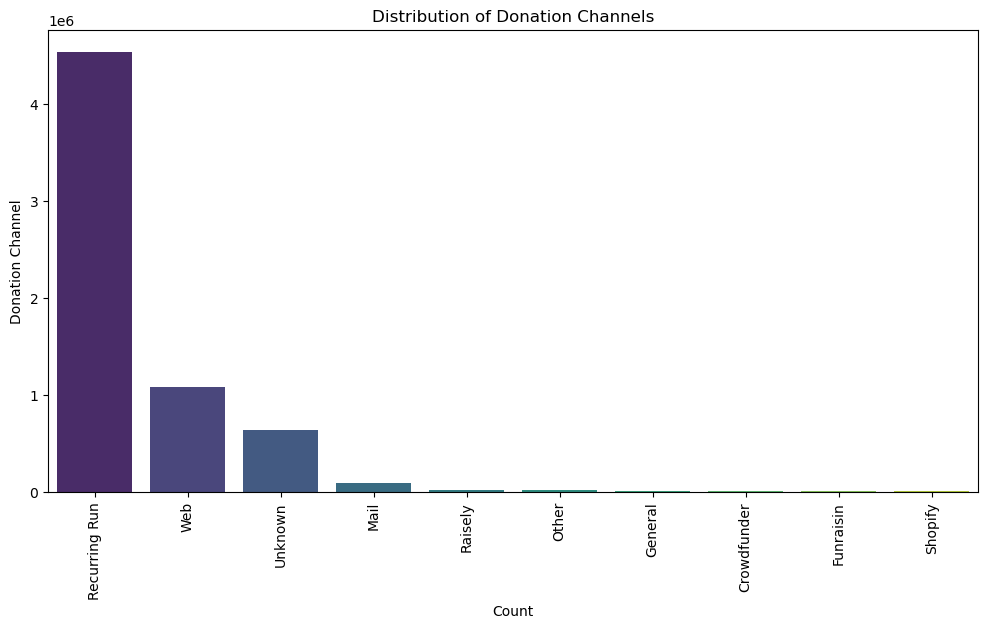

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot a bar chart for donation channels
plt.figure(figsize=(12, 6))

sns.barplot(x=donation_channel_counts.index, y=donation_channel_counts.values, palette="viridis")
plt.xticks(rotation=90)

# Labels and title
plt.xlabel("Count")
plt.ylabel("Donation Channel")
plt.title("Distribution of Donation Channels")

# Display the chart
plt.show()


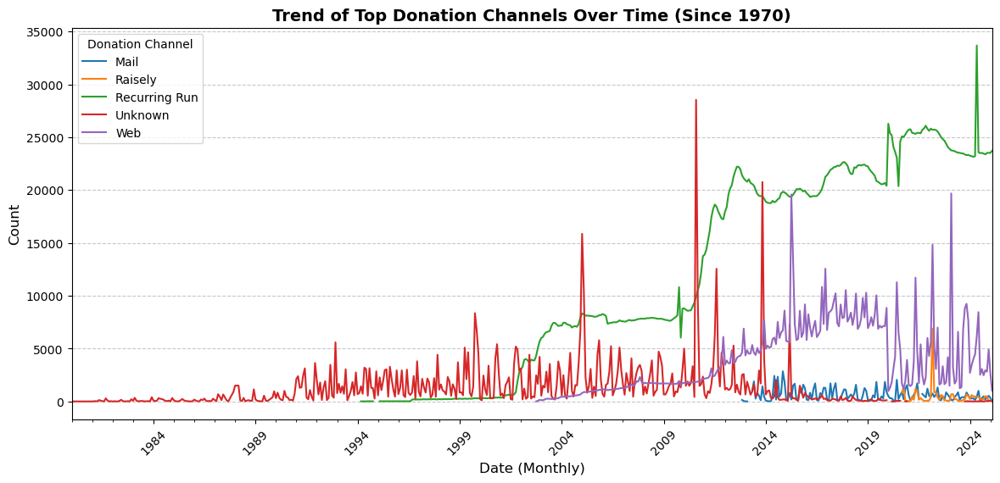

In [47]:
# Filter dataset to include only records from 1970 onwards
filtered_data = Donations_df[Donations_df['Gift_Date'] >= "1970-01-01"].copy()

# Select top 5 donation channels based on count
donation_channel_counts = filtered_data['Donation_Channel'].value_counts()
top_donation_channels = donation_channel_counts.head(5).index

# Filter data to only include top donation channels
filtered_data = filtered_data[filtered_data['Donation_Channel'].isin(top_donation_channels)]

# Convert 'Gift_Date' to datetime if not already
filtered_data['Gift_Date'] = pd.to_datetime(filtered_data['Gift_Date'])

# Aggregate counts over time (monthly)
trend_data = filtered_data.groupby([filtered_data['Gift_Date'].dt.to_period("M"), 'Donation_Channel']).size().unstack()

# Plot trend over time
plt.figure(figsize=(14, 6))
trend_data.plot(kind='line',  ax=plt.gca())

# Formatting
plt.xlabel("Date (Monthly)", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Trend of Top Donation Channels Over Time (Since 1970)", fontsize=14, fontweight="bold")
plt.xticks(rotation=45)
plt.legend(title="Donation Channel")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


In [48]:
RGID_category_counts = Donations_df['RGID'].value_counts()
print(RGID_category_counts)

a092u000003I7pMAAS    367
a092u000003HbNLAA0    366
a092u000003HbFEAA0    362
a092u000003HbKCAA0    361
a092u000003HbJxAAK    350
                     ... 
a09RG00000G5cjOYAR      1
a09RG00000GjmanYAB      1
a09RG00000GlgtpYAB      1
a09RG00000HOWoBYAX      1
a09RG00000HO5t1YAD      1
Name: RGID, Length: 148075, dtype: int64


In [49]:
Donations_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6434731 entries, 0 to 6434730
Data columns (total 8 columns):
 #   Column            Dtype         
---  ------            -----         
 0   Payment_Type      object        
 1   Donation_Channel  object        
 2   SupporterID       object        
 3   Gift_Date         datetime64[ns]
 4   DonationID        object        
 5   CampaignID        object        
 6   RGID              object        
 7   Gift_Amount       float64       
dtypes: datetime64[ns](1), float64(1), object(6)
memory usage: 392.7+ MB


### 1.2.4 Data Fix for RegularGiving

In [51]:
RegularGiving_df.head()

,Campaign_Activity,Cancel_Reason,Product_Initial,Product_Current,Cancellation_Date,Payment_Type,Installment_Frequency,SupporterID,Solicitation_Channel,Status,RGID,Date_Established,CampaignID,Amount
0,Acquisition,Constituent - can't afford Email,Global Parent,Global Parent,2021-08-15,Visa Card,Monthly,A-2870209846470,Telemarketing,Cancelled,a092u000003HftwAAC,2003-04-10,7012u00000056FHAAY,14.0
1,Acquisition,Completed Status in RE,Global Parent,Global Parent,2004-04-15,Credit Card,Monthly,A-3260199078590,Inserts,Cancelled,a092u000003He7HAAS,2003-08-15,7012u000000558kAAA,21.0
2,Acquisition,Passive Cancellation,Children's Emergency Fund,Global Parent,2023-09-15,Visa Card,Monthly,A-4660190702724,Web,Cancelled,a098v000000KfocAAC,2022-12-20,7018v0000009QqUAAU,7.0
3,Acquisition,Passive Cancellation,Global Parent Tea Towel,Global Parent,2024-01-18,Direct Debit,4 Weekly,A-4150296095271,Web,Cancelled,a09RG000000IywzYAC,2023-10-17,7018v0000009tKdAAI,21.0
4,Acquisition,NaN,Global Parent,Global Parent,NaN,Direct Debit,4 Weekly,A-8790295552353,Web,Active,a09RG000000ilzJYAQ,2023-12-07,7018v0000009UImAAM,14.0


In [52]:
RegularGiving_df.isnull().sum()

Campaign_Activity          103
Cancel_Reason            26557
Product_Initial              4
Product_Current              0
Cancellation_Date        25381
Payment_Type                 7
Installment_Frequency        0
SupporterID                  0
Solicitation_Channel       221
Status                       0
RGID                         0
Date_Established             0
CampaignID                   0
Amount                       0
dtype: int64

In [53]:
active_status_df = RegularGiving_df[RegularGiving_df['Status'] == 'Active']

nan_count = active_status_df['Cancellation_Date'].isna().sum()

print(f"Status is 'Active'，Cancellation_Date is Nan counts: {nan_count}")

Status is 'Active'，Cancellation_Date is Nan counts: 24297


In [54]:
import pandas as pd
RegularGiving_df['Cancellation_Date'] = pd.to_datetime(RegularGiving_df['Cancellation_Date'], errors='coerce')

max_date = RegularGiving_df['Cancellation_Date'].max()

mode_date = RegularGiving_df['Cancellation_Date'].mode()[0]  

RegularGiving_df.loc[RegularGiving_df['Status'] == 'Active', 'Cancellation_Date'] = RegularGiving_df.loc[
    RegularGiving_df['Status'] == 'Active', 'Cancellation_Date'].fillna(max_date)

RegularGiving_df.loc[RegularGiving_df['Status'] != 'Active', 'Cancellation_Date'] = RegularGiving_df.loc[
    RegularGiving_df['Status'] != 'Active', 'Cancellation_Date'].fillna(mode_date)

print(RegularGiving_df[['Status', 'Cancellation_Date']].head())


      Status Cancellation_Date
0  Cancelled        2021-08-15
1  Cancelled        2004-04-15
2  Cancelled        2023-09-15
3  Cancelled        2024-01-18
4     Active        2025-02-21


In [55]:
Activity_value_count = RegularGiving_df['Campaign_Activity'].value_counts()
Activity_value_count

Acquisition              153482
Conversion                 7306
Reactivation               5501
Champion for Children       114
Always On                   102
Quarterly                    16
Workplace Giving             14
Upgrade                       7
General                       5
Unknown                       2
Event                         2
Change for Good               1
Vaccinaid                     1
Unplanned Emergency           1
Name: Campaign_Activity, dtype: int64

In [56]:
RegularGiving_df['Campaign_Activity'] = RegularGiving_df['Campaign_Activity'].fillna("Other")

In [57]:
threshold = 5000  

# Ensure Campaign_Activity column exists and compute value counts
if 'Campaign_Activity' in RegularGiving_df.columns:
    Activity_value_count = RegularGiving_df['Campaign_Activity'].value_counts()

    # Create a mapping function
    def categorize_channel(channel):
        if channel in Activity_value_count and Activity_value_count[channel] < threshold:
            return "Other Activity"
        else:
            return channel

    # Apply the function to reclassify small campaign activities
    RegularGiving_df['Campaign_Activity'] = RegularGiving_df['Campaign_Activity'].apply(categorize_channel)

    # Recompute the updated category counts
    Activity_value_count = RegularGiving_df['Campaign_Activity'].value_counts()

else:
    print("The column 'Campaign_Activity' does not exist in RegularGiving_df.")


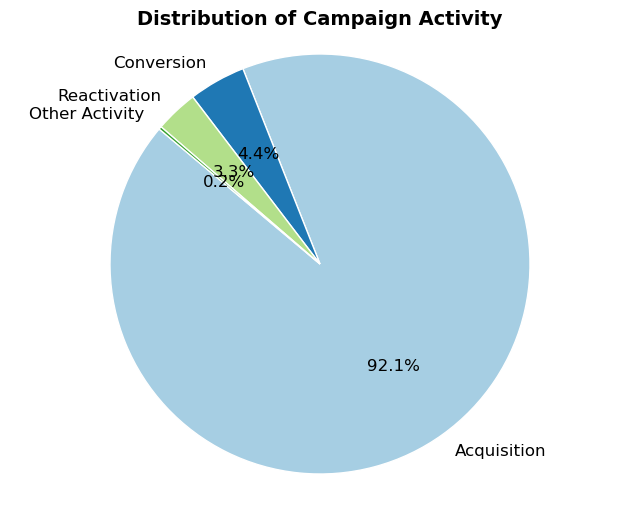

In [58]:
plt.figure(figsize=(8, 6))
wedges, texts, autotexts = plt.pie(
    Activity_value_count.values,  # Remove parentheses
    labels=Activity_value_count.index,  # Remove parentheses
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.cm.Paired.colors,
    wedgeprops={'edgecolor': 'white'},
    textprops={'fontsize': 12}
)

plt.title("Distribution of Campaign Activity", fontsize=14, fontweight="bold")
plt.axis('equal')  # Ensures the pie chart is circular
plt.show()


In [59]:
Cancel_Reason_count = RegularGiving_df['Cancel_Reason'].value_counts()
Cancel_Reason_count

Completed Status in RE                                 113223
Passive Cancellation                                    13378
Financial Difficulty                                     5814
No reason given                                          2241
No Longer Interested                                     2144
                                                        ...  
Constituent - donating elsewhere Email                      1
Bank - Lost/Stolen                                          1
Constituent - can't afford Phone - One off intended         1
Constituent - no reason given mail                          1
Constituent - no reason given Email AD                      1
Name: Cancel_Reason, Length: 97, dtype: int64

In [60]:
RegularGiving_df['Cancel_Reason'] = RegularGiving_df['Cancel_Reason'].fillna("Other Reason")

In [61]:
if 'Cancel_Reason' in RegularGiving_df.columns:
    Cancel_Reason_count = RegularGiving_df['Cancel_Reason'].value_counts()

    # Create a mapping function
    def categorize_channel(channel):
        if channel in Cancel_Reason_count and Cancel_Reason_count[channel] < threshold:
            return "Other Reason"
        else:
            return channel

    # Apply the function to reclassify small campaign activities
    RegularGiving_df['Cancel_Reason'] = RegularGiving_df['Cancel_Reason'].apply(categorize_channel)

    # Recompute the updated category counts
    Cancel_Reason_count = RegularGiving_df['Cancel_Reason'].value_counts()


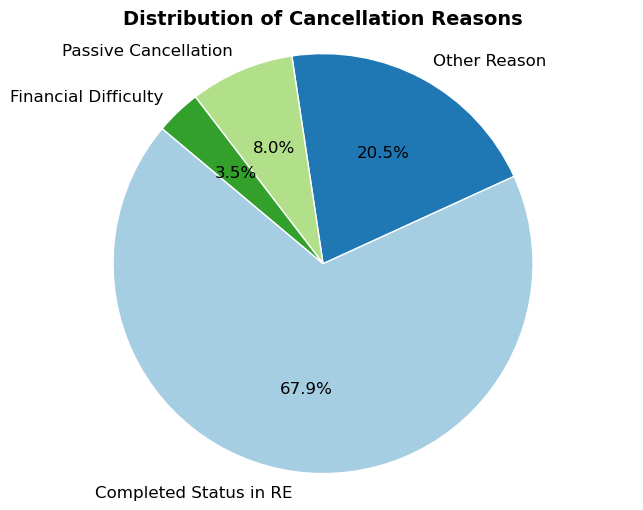

In [62]:
plt.figure(figsize=(8, 6))
wedges, texts, autotexts = plt.pie(
    Cancel_Reason_count.values,  # Remove parentheses
    labels=Cancel_Reason_count.index,  # Remove parentheses
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.cm.Paired.colors,
    wedgeprops={'edgecolor': 'white'},
    textprops={'fontsize': 12}
)

plt.title("Distribution of Cancellation Reasons", fontsize=14, fontweight="bold")
plt.axis('equal')  # Ensures the pie chart is circular
plt.show()


In [63]:
Product_Initial_counts = RegularGiving_df['Product_Initial'].value_counts()
Product_Initial_counts

Global Parent                     158229
Paddington Postcard                 7216
Children's Emergency Fund            569
The Wiggles Brave Little Books       344
Partnerships                         129
Appeal                               119
Global Parent Tea Towel               37
Bequest                                5
Unknown                                2
Engagement                             2
New Business                           1
Name: Product_Initial, dtype: int64

In [64]:
threshold = 500  # Define threshold

# Compute frequency of each category
Product_Initial_counts = RegularGiving_df['Product_Initial'].value_counts()

# Fill NaN values with "Other"
RegularGiving_df['Product_Initial'] = RegularGiving_df['Product_Initial'].fillna("Other")

# Function to categorize rare categories
def group_rare_categories(value):
    return value if Product_Initial_counts.get(value, 0) >= threshold else "Other"

# Apply transformation
RegularGiving_df['Product_Initial'] = RegularGiving_df['Product_Initial'].apply(group_rare_categories)


In [65]:
Payment_Type_counts = RegularGiving_df['Payment_Type'].value_counts()
Payment_Type_counts

Credit Card              77596
Bank Account             44743
Visa Card                20684
Master Card              19821
American Express Card     1915
Direct Debit              1423
Other                      456
Diners Club                  7
Bank                         5
Name: Payment_Type, dtype: int64

In [66]:
most_common_payment = RegularGiving_df['Payment_Type'].mode()[0]  # get the mode
RegularGiving_df['Payment_Type'].fillna(most_common_payment)


0            Visa Card
1          Credit Card
2            Visa Card
3         Direct Debit
4         Direct Debit
              ...     
166652    Bank Account
166653     Master Card
166654       Visa Card
166655    Bank Account
166656    Bank Account
Name: Payment_Type, Length: 166657, dtype: object

In [67]:
import numpy as np

# Function to categorize payment types
def merge_payment_types(payment):
    if pd.isna(payment):  # Handle NaN values
        return "Unknown"
    
    payment = str(payment)  # Ensure it's a string
    
    if "Visa" in payment or "Master" in payment or "American Express" in payment:
        return "Credit Card"
    elif "Bank" in payment:
        return "Bank Transfer"
    elif "Direct Debit" in payment:
        return "Direct Debit"
    elif payment in ["Diners Club", "Other"]:
        return "Other Payment Type"
    
    return payment  # Return original if it doesn't match any condition

# Apply transformation
RegularGiving_df['Payment_Type'] = RegularGiving_df['Payment_Type'].apply(merge_payment_types)


In [68]:
most_Solicitation_Channel_counts = RegularGiving_df['Solicitation_Channel'].value_counts()
most_Solicitation_Channel_counts

F2F                    64223
Web                    39019
Door to door           23605
Telemarketing          15210
Retail                  9674
DM                      4967
Inserts                 2909
Event                   1746
Unsolicited             1473
General                 1404
Travel Trip              912
Unknown                  543
B2B                      321
DRTV                     264
TV                        78
Cold                      17
Payroll                   14
EDM                       12
Other                      9
Newspaper                  9
Member Get Member          8
Outdoor Advertising        7
Press                      6
Insert                     3
SMS                        2
Envelope                   1
Name: Solicitation_Channel, dtype: int64

In [69]:
RegularGiving_df['Solicitation_Channel'] = RegularGiving_df.groupby('CampaignID')['Solicitation_Channel'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else "Other"))


In [70]:
def merge_solicitation_channels(channel):
    if channel in ["Web", "EDM"]:
        return "Digital Marketing"
    elif channel in ["Inserts", "Insert", "Newspaper"]:
        return "Print Media"
    elif channel in ["Outdoor Advertising", "Press", "TV"]:
        return "Mass Media"
    elif channel in ["B2B", "Payroll", "Corporate"]:
        return "Corporate & B2B"
    elif channel in ["DRTV", "Cold"]:
        return "Telemarketing"
    elif channel in ["Unknown", "Other"]:
        return "Other Channels"
    return channel

RegularGiving_df['Solicitation_Channel'] = RegularGiving_df['Solicitation_Channel'].apply(merge_solicitation_channels)


Text(0.5, 1.0, 'Distribution of Solicitation Channels')

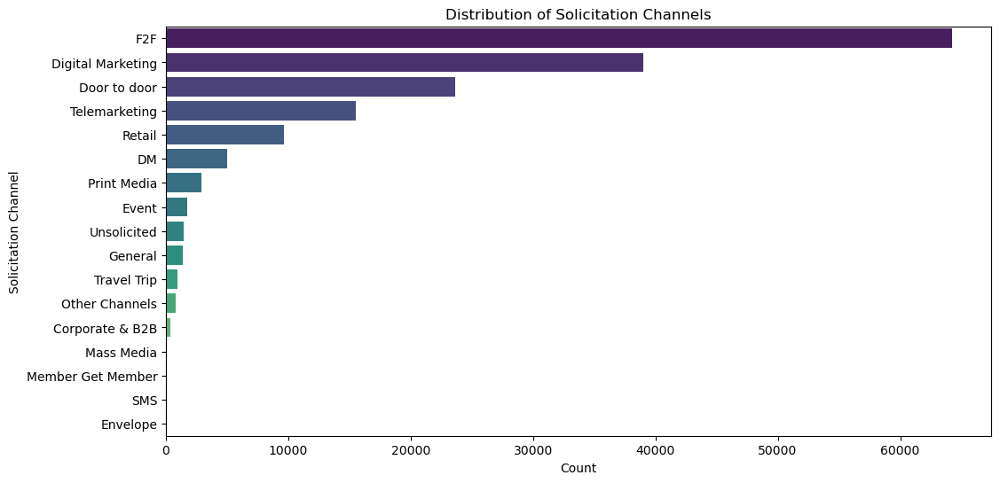

In [71]:
# count the Solicitation_Channel 
solicitation_counts = RegularGiving_df['Solicitation_Channel'].value_counts()

# barplot
plt.figure(figsize=(12, 6))
sns.barplot(x=solicitation_counts.values, y=solicitation_counts.index, palette="viridis")

# set the information
plt.xlabel("Count")
plt.ylabel("Solicitation Channel")
plt.title("Distribution of Solicitation Channels")

### 1.2.5 Fix for Supporter

In [73]:
Supporters_df.head()

,Age_Bucket,DoNotContact,Donation.GiftDate_Last,Have_HomePhone,DoNotPhone,Have_MobilePhone,Have_Email,DoNotMail,Mailing_City,DoNotEmail,Mailing_State,DoNotSMS,Mailing_Country,Donor_Type,SupporterID,Donation.GiftDate_First,Mailing_Postcode,Have_WorkPhone
0,NaN,True,2007-03-02,Yes,True,No,No,True,BONDI JUNCTION,True,NSW,True,Australia,Individual,C-3030020927884,1991-01-22,2022.0,Yes
1,NaN,False,1989-11-01,No,False,No,No,False,NaN,False,NaN,False,NaN,Individual,C-33500210211000,1989-11-01,NaN,No
2,NaN,False,1987-12-01,No,False,No,No,False,NaN,False,NaN,False,NaN,Individual,C-3220021369131,1987-12-01,NaN,No
3,NaN,False,1999-04-16,No,False,No,No,False,NaN,False,NaN,False,NaN,Individual,C-3640021990181,1999-04-16,NaN,No
4,NaN,False,1991-06-17,No,False,No,No,False,NaN,False,NaN,False,NaN,Individual,C-4960021270990,1991-06-17,NaN,No


In [74]:
# flite Mailing_City is emptu DoNotContact is False's data
nan_mailing_city_false_contact = Supporters_df[(Supporters_df['Mailing_City'].isna()) & (Supporters_df['DoNotContact'] == False)]

# counting the nan_mailing_city_false_contact
count = nan_mailing_city_false_contact.shape[0]

# print the number of counts
print(f"he number where Mailing_City is NaN and DoNotContact is False: {count}")


he number where Mailing_City is NaN and DoNotContact is False: 397419


In [75]:
Supporters_df.isnull().sum()

Age_Bucket                 596776
DoNotContact                    0
Donation.GiftDate_Last     154759
Have_HomePhone                  0
DoNotPhone                      0
Have_MobilePhone                0
Have_Email                      0
DoNotMail                       0
Mailing_City               405504
DoNotEmail                      0
Mailing_State              405504
DoNotSMS                        0
Mailing_Country            405504
Donor_Type                      0
SupporterID                     0
Donation.GiftDate_First    154759
Mailing_Postcode           405504
Have_WorkPhone                  0
dtype: int64

In [76]:
Age_Bucket_counts = Supporters_df['Age_Bucket'].value_counts()
Age_Bucket_counts

30 - 39     21936
40 - 49     13490
50 - 59      8936
60 - 59      6701
18 to 29     5749
70 - 79      4854
80 - 100     2850
Name: Age_Bucket, dtype: int64

In [77]:
Supporters_df['Age_Bucket'] = Supporters_df['Age_Bucket'].fillna("Unknown")

In [78]:
Supporters_df[['Mailing_Postcode']] = Supporters_df[['Mailing_Postcode']].fillna(0)


In [79]:
#fill na with cookies not accepted
Supporters_df[['Mailing_City', 'Mailing_State', 'Mailing_Country']] = Supporters_df[['Mailing_City', 'Mailing_State', 'Mailing_Country']].fillna("Unknown")


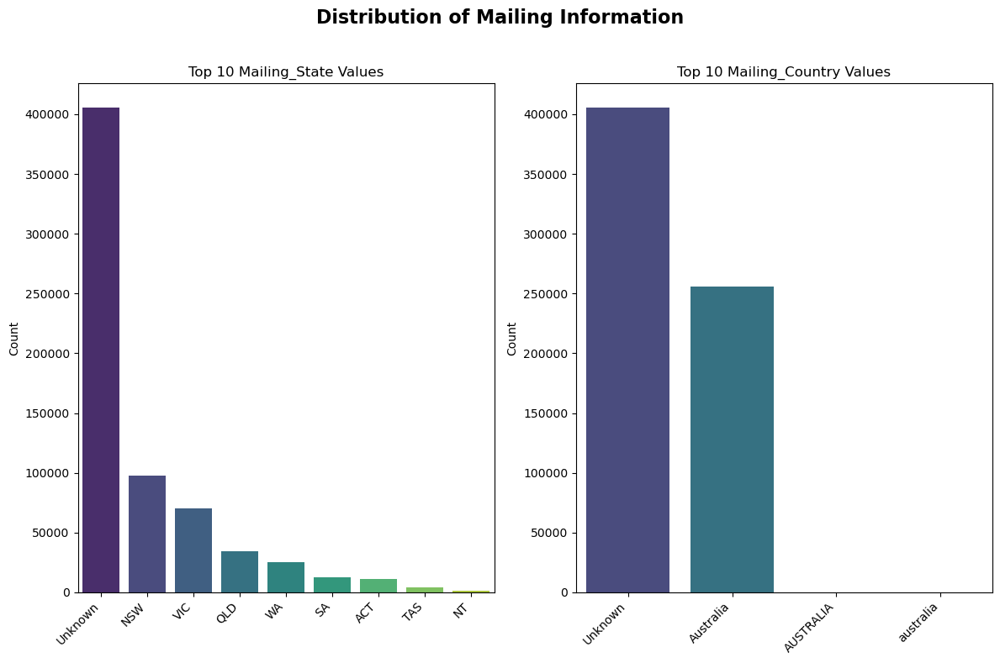

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

columns_to_plot = [ 'Mailing_State', 'Mailing_Country']
value_counts = {col: Supporters_df[col].value_counts() for col in columns_to_plot}

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
fig.suptitle("Distribution of Mailing Information", fontsize=16, fontweight="bold")

for ax, (col, counts) in zip(axes.flatten(), value_counts.items()):
    sns.barplot(x=counts.index[:10], y=counts.values[:10], ax=ax, palette="viridis")
    ax.set_title(f"Top 10 {col} Values", fontsize=12)
    ax.set_xlabel("")
    ax.set_ylabel("Count")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [81]:
Mailing_Country_counts = Supporters_df['Mailing_Country'].value_counts()
Mailing_Country_counts

Unknown      405504
Australia    255768
AUSTRALIA        13
australia         7
Name: Mailing_Country, dtype: int64

In [82]:
# create SupporterID -> MailingPostcode's map
postcode_map = Supporters_updated_df.set_index('SupporterID')['MailingPostcode'].to_dict()

# using this map to reflect Mailing_postcode in supports_df
Supporters_df['Mailing_Postcode'] = Supporters_df.apply(
    lambda row: postcode_map[row['SupporterID']] 
                if row['SupporterID'] in postcode_map and pd.notna(postcode_map[row['SupporterID']]) 
                else row['Mailing_Postcode'],
    axis=1
)
Supporters_df['Mailing_Postcode'] = pd.to_numeric(Supporters_df['Mailing_Postcode'], errors='coerce').astype('Int64')


### 1.2.6 Extra Data set

In [84]:
extra_data_path = 'PostcodeData.csv'
df_postcode = pd.read_csv(extra_data_path)

In [85]:
df_postcode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2633 entries, 0 to 2632
Data columns (total 66 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Postcode \ MOSAIC code  2633 non-null   int64  
 1   A                       711 non-null    float64
 2   B                       1155 non-null   float64
 3   C                       194 non-null    float64
 4   D                       1572 non-null   float64
 5   E                       1492 non-null   float64
 6   F                       907 non-null    float64
 7   G                       667 non-null    float64
 8   H                       1892 non-null   float64
 9   I                       1764 non-null   float64
 10  J                       1459 non-null   float64
 11  K                       1446 non-null   float64
 12  L                       1534 non-null   float64
 13  M                       1903 non-null   float64
 14  N                       1995 non-null   

In [86]:
import os
print(os.listdir())  # Should show 'PostcodeData.csv'


['EDA.ipynb', 'Untitled1.ipynb', '.DS_Store', 'Data_dictionary_with_sample.xlsx', 'Untitled.ipynb', 'PostcodeData.csv', 'Member Created Count by Month.png', 'Correlation.png', 'UNICEF_Full_Data', '.ipynb_checkpoints', 'Processed_Postcode_Data.csv', 'encoded_df.csv', 'Exploratory Data Analysis of United Nations International Children.docx', 'Exploratory Data Analysis of United Nations International Children.pdf', 'my_plot.png']


In [87]:
# Clean column names by stripping spaces
df_postcode.columns = df_postcode.columns.str.strip()

# Identify postcode column (assuming it's the first column)
postcode_column = df_postcode.columns[0]

# Identify category columns (A to N)
category_columns = list("ABCDEFGHIJKLMN")

# Filter dataset to keep only postcode and category columns
df_filtered = df_postcode[[postcode_column] + category_columns].copy()

# Convert category columns to numeric (handle NaNs)
df_filtered[category_columns] = df_filtered[category_columns].apply(pd.to_numeric, errors='coerce').fillna(0)

def get_top_category(row):
    sorted_categories = row[category_columns].sort_values(ascending=False)
    return sorted_categories.index[0]

# Apply function to determine the category for each postcode
df_filtered["Category"] = df_filtered.apply(get_top_category, axis=1)

# Keep only Postcode and determined Category
df_result = df_filtered[[postcode_column, "Category"]]

# Rename postcode column to match your final_df
df_result = df_result.rename(columns={postcode_column: "Mailing_Postcode"})

# Convert Mailing_Postcode to string to avoid merge issues
df_result["Mailing_Postcode"] = df_result["Mailing_Postcode"].astype(int)

# Display the processed data
print(df_result.head())  # Show first few rows

   Mailing_Postcode Category
0               800        C
1               810        B
2               812        I
3               820        F
4               822        N


## 1.3 Column Correlation Check

### 1.3.1 Donation Correlation

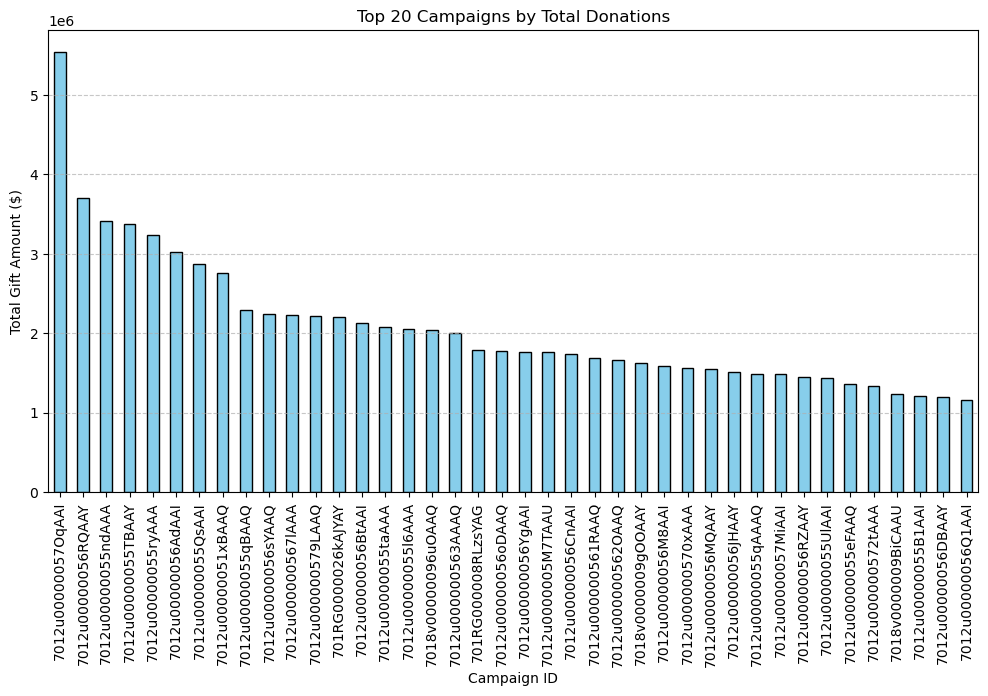

In [90]:
# Group the data by 'CampaignID' and sum the 'Gift_Amount'
donation_sums = Donations_df.groupby('CampaignID')['Gift_Amount'].sum()

# Select top 20 campaigns with the highest donation sums for better visualization
top_campaigns = donation_sums.nlargest(40)

# Plot the bar chart
plt.figure(figsize=(12, 6))
top_campaigns.plot(kind='bar', color='skyblue', edgecolor='black')

# Formatting the plot
plt.xlabel("Campaign ID")
plt.ylabel("Total Gift Amount ($)")
plt.title("Top 20 Campaigns by Total Donations")
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()


In [91]:
donation_table = Donations_df.groupby('CampaignID')['Gift_Amount'].agg(['sum','mean','count'])
donation_table

,sum,mean,count
CampaignID,,,
7012u00000051lMAAQ,7.00,7.000000,1
7012u00000051lOAAQ,1274.70,424.900000,3
7012u00000051lQAAQ,17811.50,64.070144,278
7012u00000051laAAA,8299.20,169.371429,49
7012u00000051ldAAA,56.00,56.000000,1
...,...,...,...
701RG00000cx3nKYAQ,140.00,140.000000,1
701RG00000cx43OYAQ,1774.15,63.362500,28
701RG00000cx7E8YAI,4044.60,192.600000,21


In [92]:
pd.crosstab(Donations_df['Payment_Type'],Donations_df['Donation_Channel'])

Donation_Channel,Crowdfunder,Funraisin,General,Mail,Other,Raisely,Recurring Run,Shopify,Unknown,Web
Payment_Type,,,,,,,,,,
Bank Account,0,0,0,0,1,0,344681,0,0,49
Cash,0,0,525,2265,2,0,19755,0,6725,47411
Cheque,0,0,3347,38484,26,0,0,0,108456,26
Credit Card,0,0,4945,49759,9110,0,3151930,0,140351,730500
Direct Debit,0,0,9,23,0,0,1020452,0,529,63004
Direct Deposit,0,0,0,0,4619,0,0,0,36,7
Other,0,0,4502,498,430,0,3580,0,386015,159839
Paypal,0,0,0,0,792,1174,0,1760,21,82892
Shopify,0,0,0,0,0,0,0,4234,0,0


In [93]:
df_D = Donations_df.copy() 

df_D = pd.get_dummies(df_D, columns=['Payment_Type', 'Donation_Channel'], drop_first=True, dtype=int)

print(df_D.head())


       SupporterID  Gift_Date          DonationID          CampaignID RGID  \
0  C-8390062979965 1993-12-02  0062u000009RhlYAAS  7012u00000057PeAAI  NaN   
1  C-3790398596568 2021-05-03  0062u00000C4ru2AAB  7012u000000Bxv0AAC  NaN   
2  C-6020209832747 2023-02-21  0068v000002ay3aAAA  7018v0000009gOOAAY  NaN   
3  C-3080456410533 2020-06-17  0062u000009PmkwAAC  7012u00000056MOAAY  NaN   
4  C-9600343495465 2014-12-24  0062u000009VOqAAAW  7012u0000005687AAA  NaN   

   Gift_Amount  Payment_Type_Cash  Payment_Type_Cheque  \
0         14.0                  0                    0   
1         76.3                  0                    0   
2         21.0                  0                    0   
3         10.5                  0                    0   
4         49.0                  1                    0   

   Payment_Type_Credit Card  Payment_Type_Direct Debit  ...  \
0                         0                          0  ...   
1                         1                          0  

In [94]:
# Ensure that we are selecting only numeric columns before computing correlation
correlation_matrix_D = df_D.corr(numeric_only=True)

print(correlation_matrix_D)

                                Gift_Amount  Payment_Type_Cash  \
Gift_Amount                        1.000000           0.006000   
Payment_Type_Cash                  0.006000           1.000000   
Payment_Type_Cheque                0.027172          -0.016986   
Payment_Type_Credit Card          -0.015364          -0.144879   
Payment_Type_Direct Debit         -0.011471          -0.049431   
Payment_Type_Direct Deposit        0.011624          -0.002957   
Payment_Type_Other                 0.023250          -0.033736   
Payment_Type_Paypal                0.008966          -0.012830   
Payment_Type_Shopify               0.001844          -0.002818   
Payment_Type_Stripe                0.001955          -0.008898   
Donation_Channel_Funraisin         0.000148          -0.003366   
Donation_Channel_General           0.005646           0.011535   
Donation_Channel_Mail              0.010972           0.014312   
Donation_Channel_Other             0.009433          -0.006008   
Donation_C

In [95]:
Donations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6434731 entries, 0 to 6434730
Data columns (total 8 columns):
 #   Column            Dtype         
---  ------            -----         
 0   Payment_Type      object        
 1   Donation_Channel  object        
 2   SupporterID       object        
 3   Gift_Date         datetime64[ns]
 4   DonationID        object        
 5   CampaignID        object        
 6   RGID              object        
 7   Gift_Amount       float64       
dtypes: datetime64[ns](1), float64(1), object(6)
memory usage: 392.7+ MB


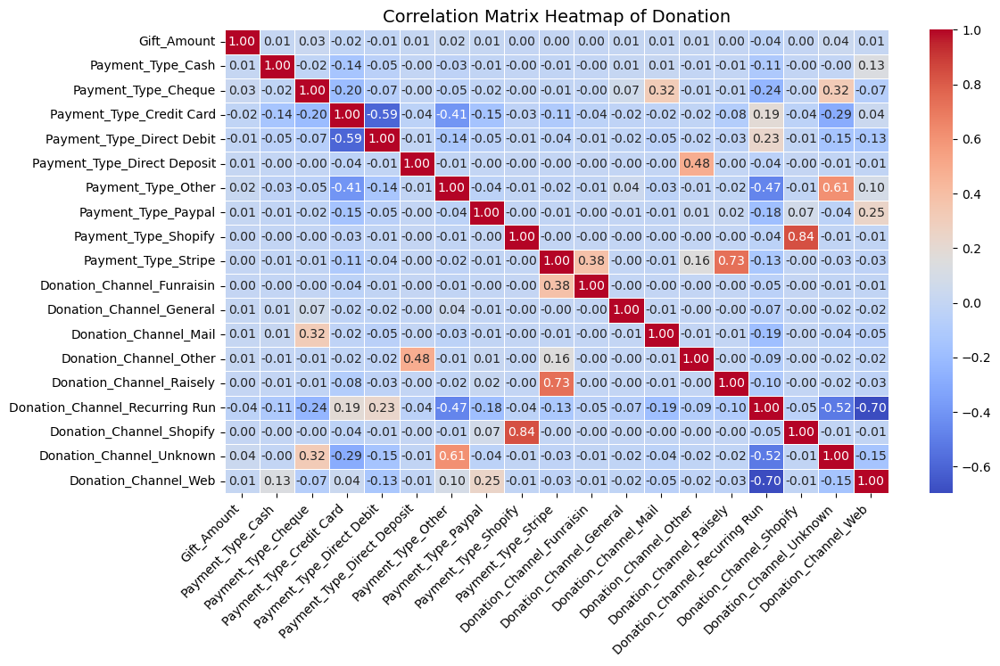

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
ax = sns.heatmap(correlation_matrix_D, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

plt.xticks(rotation=45, ha='right')  
plt.yticks(rotation=0)
plt.subplots_adjust(bottom=0.3, top=0.95)  
plt.title("Correlation Matrix Heatmap of Donation", fontsize=14)

plt.show()


### 1.3.2 Campaigns Correlation

In [98]:
df_rg = RegularGiving_df.copy()

In [99]:
df_rg.head()

,Campaign_Activity,Cancel_Reason,Product_Initial,Product_Current,Cancellation_Date,Payment_Type,Installment_Frequency,SupporterID,Solicitation_Channel,Status,RGID,Date_Established,CampaignID,Amount
0,Acquisition,Other Reason,Global Parent,Global Parent,2021-08-15,Credit Card,Monthly,A-2870209846470,Telemarketing,Cancelled,a092u000003HftwAAC,2003-04-10,7012u00000056FHAAY,14.0
1,Acquisition,Completed Status in RE,Global Parent,Global Parent,2004-04-15,Credit Card,Monthly,A-3260199078590,Print Media,Cancelled,a092u000003He7HAAS,2003-08-15,7012u000000558kAAA,21.0
2,Acquisition,Passive Cancellation,Children's Emergency Fund,Global Parent,2023-09-15,Credit Card,Monthly,A-4660190702724,Digital Marketing,Cancelled,a098v000000KfocAAC,2022-12-20,7018v0000009QqUAAU,7.0
3,Acquisition,Passive Cancellation,Other,Global Parent,2024-01-18,Direct Debit,4 Weekly,A-4150296095271,Digital Marketing,Cancelled,a09RG000000IywzYAC,2023-10-17,7018v0000009tKdAAI,21.0
4,Acquisition,Other Reason,Global Parent,Global Parent,2025-02-21,Direct Debit,4 Weekly,A-8790295552353,Digital Marketing,Active,a09RG000000ilzJYAQ,2023-12-07,7018v0000009UImAAM,14.0


In [100]:
df_rg = pd.get_dummies(df_rg, columns=['Campaign_Activity', 'Cancel_Reason','Product_Initial','Product_Current',
                                       'Payment_Type','Installment_Frequency','Solicitation_Channel','Status'], drop_first=True, dtype=int)
# Ensure that we are selecting only numeric columns before computing correlation
correlation_matrix_rg = df_rg.corr(numeric_only=True)

print(correlation_matrix_rg)

                                                  Amount  \
Amount                                          1.000000   
Campaign_Activity_Conversion                   -0.017009   
Campaign_Activity_Other Activity                0.116794   
Campaign_Activity_Reactivation                 -0.014038   
Cancel_Reason_Financial Difficulty             -0.001683   
Cancel_Reason_Other Reason                      0.035933   
Cancel_Reason_Passive Cancellation             -0.005400   
Product_Initial_Global Parent                   0.014466   
Product_Initial_Other                           0.082184   
Product_Initial_Paddington Postcard            -0.044488   
Product_Current_Children's Emergency Fund       0.032214   
Product_Current_Global Parent                  -0.005176   
Product_Current_Paddington Postcard            -0.027880   
Product_Current_The Wiggles Brave Little Books -0.006879   
Payment_Type_Credit Card                        0.014821   
Payment_Type_Direct Debit               

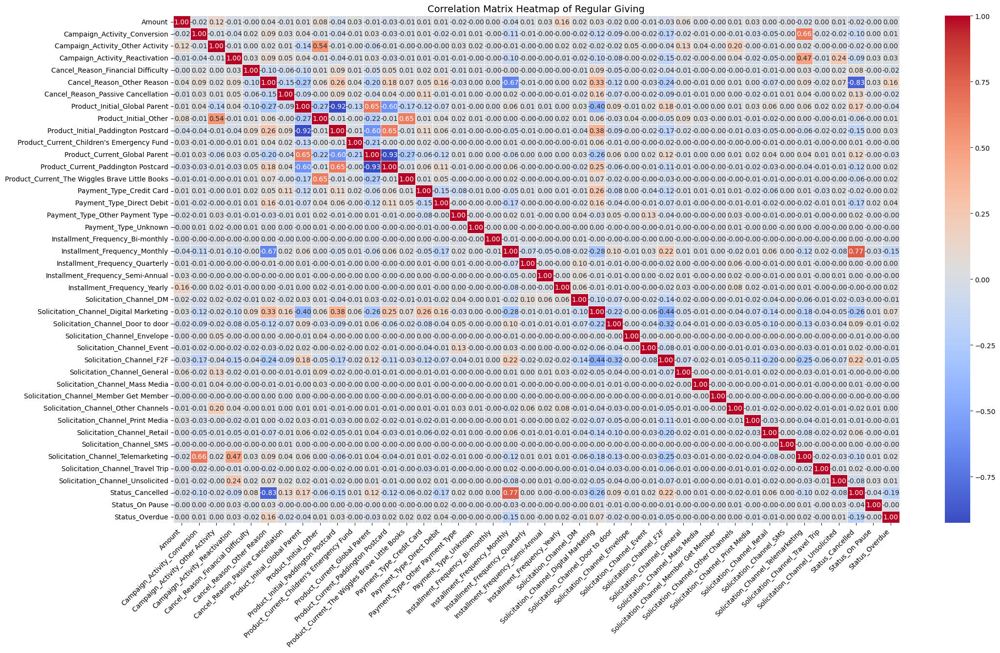

In [101]:
plt.figure(figsize=(24, 16))
ax = sns.heatmap(correlation_matrix_rg, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

plt.xticks(rotation=45, ha='right')  
plt.yticks(rotation=0)
plt.subplots_adjust(bottom=0.3, top=0.95)  
plt.title("Correlation Matrix Heatmap of Regular Giving", fontsize=14)

plt.show()


  0%|                                                  | 0/1240 [00:00<?, ?it/s]


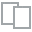
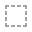
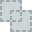
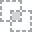
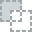
...
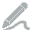
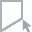
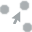
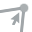
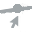

In [102]:
from dataprep.eda import plot
import pandas as pd
 
# Ensure df_rg is loaded and contains data
plot(df_rg)


## 1.4 Merge Data

In [104]:
DM_Campaigns_df = Campaigns_df[Campaigns_df['Solicitation_Channel'] == "DM"]

In [105]:
DM_Campaigns_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5541 entries, 3 to 21857
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ParentID               134 non-null    object        
 1   Start_Date             5541 non-null   datetime64[ns]
 2   Content_Thematic_Area  5541 non-null   object        
 3   Content_Focus          5541 non-null   object        
 4   Type                   5541 non-null   object        
 5   Sub_Type               5541 non-null   object        
 6   Activity               5541 non-null   object        
 7   CampaignID             5541 non-null   object        
 8   Solicitation_Channel   5541 non-null   object        
 9   Appeal_Season          5541 non-null   object        
dtypes: datetime64[ns](1), object(9)
memory usage: 476.2+ KB


In [106]:
CampaignMembers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52099328 entries, 0 to 52099327
Data columns (total 5 columns):
 #   Column             Dtype         
---  ------             -----         
 0   MemberID           object        
 1   CampaignID         object        
 2   SupporterID        object        
 3   MemberCreatedDate  datetime64[ns]
 4   Month              int64         
dtypes: datetime64[ns](1), int64(1), object(3)
memory usage: 1.9+ GB


In [107]:
# Merge the two dataframes on 'CampaignID'
DM_particited = CampaignMembers_df.merge(DM_Campaigns_df[['CampaignID','Start_Date']], on='CampaignID', how='inner')
DM_particited.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2426723 entries, 0 to 2426722
Data columns (total 6 columns):
 #   Column             Dtype         
---  ------             -----         
 0   MemberID           object        
 1   CampaignID         object        
 2   SupporterID        object        
 3   MemberCreatedDate  datetime64[ns]
 4   Month              int64         
 5   Start_Date         datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(3)
memory usage: 129.6+ MB


In [108]:
print(DM_particited.isnull().sum())

MemberID             0
CampaignID           0
SupporterID          0
MemberCreatedDate    0
Month                0
Start_Date           0
dtype: int64


In [109]:
Donations_df['Gift_Date'] = pd.to_datetime(Donations_df['Gift_Date'])
DM_particited['Start_Date'] = pd.to_datetime(DM_particited['Start_Date'])


In [110]:
merged_data = DM_particited.merge(Donations_df, on=["SupporterID","CampaignID"], how="left")
merged_data.info()
print(merged_data.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2716499 entries, 0 to 2716498
Data columns (total 12 columns):
 #   Column             Dtype         
---  ------             -----         
 0   MemberID           object        
 1   CampaignID         object        
 2   SupporterID        object        
 3   MemberCreatedDate  datetime64[ns]
 4   Month              int64         
 5   Start_Date         datetime64[ns]
 6   Payment_Type       object        
 7   Donation_Channel   object        
 8   Gift_Date          datetime64[ns]
 9   DonationID         object        
 10  RGID               object        
 11  Gift_Amount        float64       
dtypes: datetime64[ns](3), float64(1), int64(1), object(7)
memory usage: 269.4+ MB
MemberID                   0
CampaignID                 0
SupporterID                0
MemberCreatedDate          0
Month                      0
Start_Date                 0
Payment_Type         2371512
Donation_Channel     2371512
Gift_Date            23715

In [111]:
# take the unique value in  (SupporterID, CampaignID) 
dm_pairs = set(zip(DM_particited['SupporterID'], DM_particited['CampaignID']))
donation_pairs = set(zip(Donations_df['SupporterID'], Donations_df['CampaignID']))

# find DM_particited but Donations_df is null's combination
only_in_dm = dm_pairs - donation_pairs
print("Show the Combination in  DM_particited but not in Donations_df :", len(only_in_dm))

# find Donations_df but DM_particited is null's combination
only_in_donations = donation_pairs - dm_pairs
print("Show the Combination in  Donations_df but not in DM_particited:", len(only_in_donations))


Show the Combination in  DM_particited but not in Donations_df : 2371512
Show the Combination in  Donations_df but not in DM_particited: 1252002


In [112]:
# check the gift date is after start date in 3 month
merged_data['y'] = (
    merged_data['Gift_Date'].notna() & 
    (merged_data['Gift_Date'] >= merged_data['Start_Date']) & 
    (merged_data['Gift_Date'] <= merged_data['Start_Date'] + pd.DateOffset(months=3))
).astype(int)

# merge
final_df = merged_data.merge(Supporters_df, on="SupporterID", how="left")

final_df.head()

,MemberID,CampaignID,SupporterID,MemberCreatedDate,Month,Start_Date,Payment_Type,Donation_Channel,Gift_Date,DonationID,...,DoNotMail,Mailing_City,DoNotEmail,Mailing_State,DoNotSMS,Mailing_Country,Donor_Type,Donation.GiftDate_First,Mailing_Postcode,Have_WorkPhone
0,00v2u000006LD2eAAG,7012u000000BxvoAAC,C-7600376076434,2021-05-03,5,2021-05-29,NaN,NaN,NaT,NaN,...,False,Unknown,False,Unknown,False,Unknown,Individual,2015-05-31,3150,No
1,00v2u000006LVenAAG,7012u000000BxvoAAC,C-4040378522348,2021-05-03,5,2021-05-29,NaN,NaN,NaT,NaN,...,False,BURRADOO,False,NSW,False,Australia,Individual,2015-05-31,2576,Yes
2,00v2u000006LSHHAA4,7012u000000BxvoAAC,C-8470384277596,2021-05-03,5,2021-05-29,NaN,NaN,NaT,NaN,...,False,Unknown,False,Unknown,False,Unknown,Individual,2015-06-08,2073,No
3,00v2u000006LUY0AAO,7012u000000BxvoAAC,C-9980387978879,2021-05-03,5,2021-05-29,NaN,NaN,NaT,NaN,...,False,Unknown,True,Unknown,False,Unknown,Individual,2015-06-03,2320,No
4,00v2u000006LTuKAAW,7012u000000BxvoAAC,C-6150496157387,2021-05-03,5,2021-05-29,NaN,NaN,NaT,NaN,...,False,Unknown,False,Unknown,False,Unknown,Individual,2015-06-03,820,No


In [113]:
# check Donations_df have dupplication or not (SupporterID, CampaignID)
print(Donations_df.duplicated(subset=["SupporterID", "CampaignID"]).sum())


5127518


In [114]:
print(final_df.isnull().sum())

MemberID                         0
CampaignID                       0
SupporterID                      0
MemberCreatedDate                0
Month                            0
Start_Date                       0
Payment_Type               2371512
Donation_Channel           2371512
Gift_Date                  2371512
DonationID                 2371512
RGID                       2425832
Gift_Amount                2371512
y                                0
Age_Bucket                    4930
DoNotContact                  4930
Donation.GiftDate_Last       37112
Have_HomePhone                4930
DoNotPhone                    4930
Have_MobilePhone              4930
Have_Email                    4930
DoNotMail                     4930
Mailing_City                  4930
DoNotEmail                    4930
Mailing_State                 4930
DoNotSMS                      4930
Mailing_Country               4930
Donor_Type                    4930
Donation.GiftDate_First      37112
Mailing_Postcode    

In [115]:
final_df = final_df.merge(RegularGiving_df[['Status','Installment_Frequency','SupporterID']], on="SupporterID", how="left")


In [116]:
final_df['y'].value_counts()

0    2891215
1      35544
Name: y, dtype: int64

In [117]:
final_df.shape

(2926759, 32)

In [118]:
print(final_df.isnull().sum())

MemberID                         0
CampaignID                       0
SupporterID                      0
MemberCreatedDate                0
Month                            0
Start_Date                       0
Payment_Type               2543288
Donation_Channel           2543288
Gift_Date                  2543288
DonationID                 2543288
RGID                       2599942
Gift_Amount                2543288
y                                0
Age_Bucket                    4930
DoNotContact                  4930
Donation.GiftDate_Last       37153
Have_HomePhone                4930
DoNotPhone                    4930
Have_MobilePhone              4930
Have_Email                    4930
DoNotMail                     4930
Mailing_City                  4930
DoNotEmail                    4930
Mailing_State                 4930
DoNotSMS                      4930
Mailing_Country               4930
Donor_Type                    4930
Donation.GiftDate_First      37153
Mailing_Postcode    

In [119]:
import numpy as np
import pandas as pd

# fill 'Null' with NaN
final_df['Mailing_Postcode'] = pd.to_numeric(final_df['Mailing_Postcode'], errors='coerce')

# check is any null or not
print(final_df['Mailing_Postcode'].isna().sum())


18777


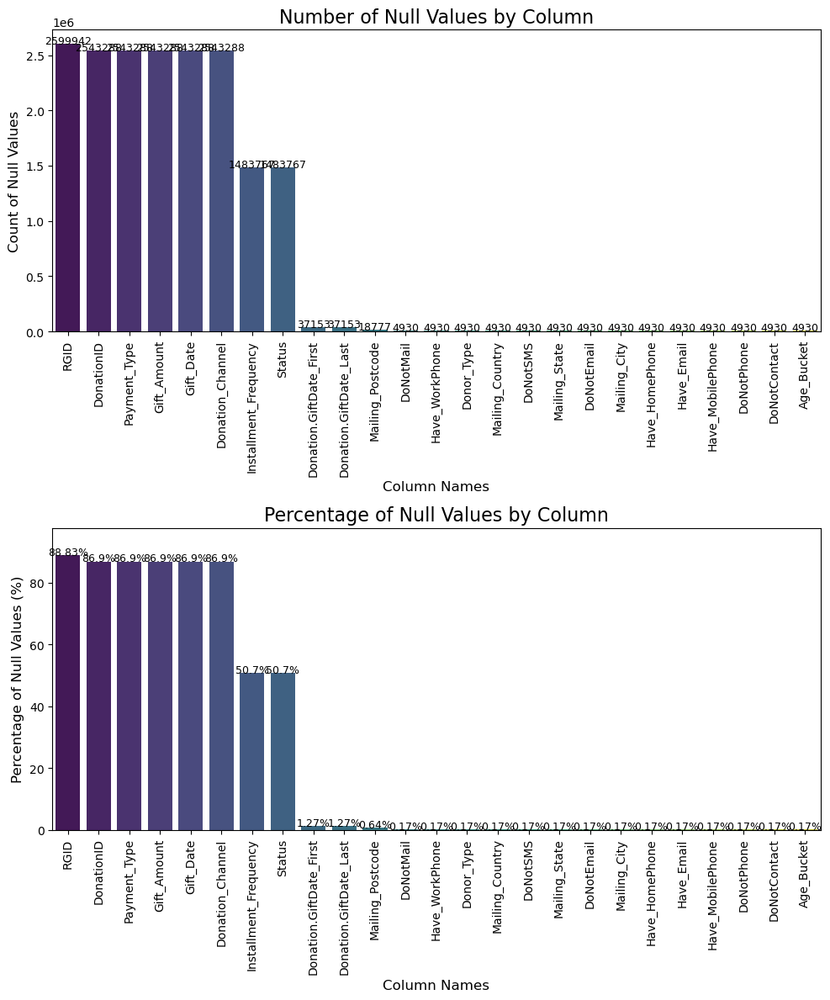


Summary of Null Values:
                           Count  Percentage
RGID                     2599942       88.83
DonationID               2543288       86.90
Payment_Type             2543288       86.90
Gift_Amount              2543288       86.90
Gift_Date                2543288       86.90
Donation_Channel         2543288       86.90
Installment_Frequency    1483767       50.70
Status                   1483767       50.70
Donation.GiftDate_First    37153        1.27
Donation.GiftDate_Last     37153        1.27
Mailing_Postcode           18777        0.64
DoNotMail                   4930        0.17
Have_WorkPhone              4930        0.17
Donor_Type                  4930        0.17
Mailing_Country             4930        0.17
DoNotSMS                    4930        0.17
Mailing_State               4930        0.17
DoNotEmail                  4930        0.17
Mailing_City                4930        0.17
Have_HomePhone              4930        0.17
Have_Email                  49

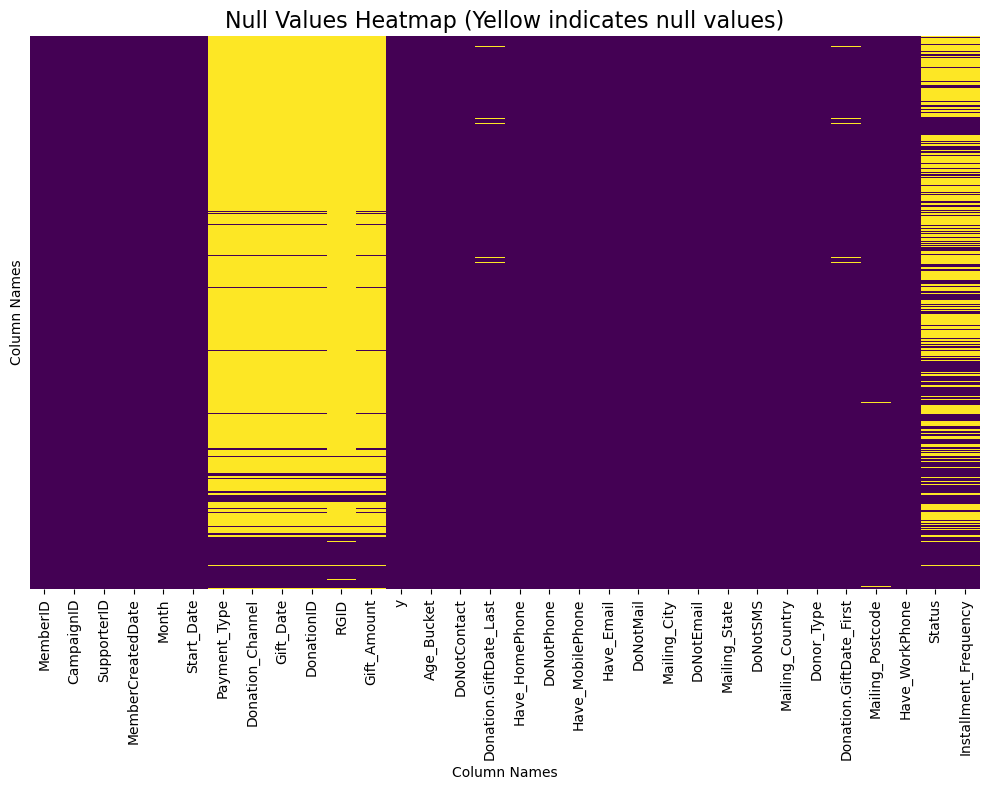

In [120]:
# Calculate the number of null values for each column
null_counts = final_df.isnull().sum().sort_values(ascending=False)

# Calculate the percentage of null values
null_percentage = (null_counts / len(final_df) * 100).round(2)

# Create a DataFrame with the results
null_df = pd.DataFrame({
    'Count': null_counts,
    'Percentage': null_percentage
})

# Filter out columns with no null values
null_df = null_df[null_df['Count'] > 0]

# If there are no null values, print a message
if len(null_df) == 0:
    print("No null values found in the DataFrame.")
else:
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))
    
    # Plot the count of null values
    sns.barplot(x=null_df.index, y='Count', data=null_df, ax=ax1, palette='viridis')
    ax1.set_title('Number of Null Values by Column', fontsize=16)
    ax1.set_xlabel('Column Names', fontsize=12)
    ax1.set_ylabel('Count of Null Values', fontsize=12)
    ax1.tick_params(axis='x', rotation=90)
    
    # Add text labels on top of the bars
    for i, v in enumerate(null_df['Count']):
        ax1.text(i, v + 0.1, str(v), ha='center', fontsize=9)
    
    # Plot the percentage of null values
    sns.barplot(x=null_df.index, y='Percentage', data=null_df, ax=ax2, palette='viridis')
    ax2.set_title('Percentage of Null Values by Column', fontsize=16)
    ax2.set_xlabel('Column Names', fontsize=12)
    ax2.set_ylabel('Percentage of Null Values (%)', fontsize=12)
    ax2.tick_params(axis='x', rotation=90)
    
    # Add text labels on top of the bars
    for i, v in enumerate(null_df['Percentage']):
        ax2.text(i, v + 0.1, f"{v}%", ha='center', fontsize=9)
    
    # Set a maximum value for the y-axis in the percentage plot
    ax2.set_ylim(0, min(100, max(null_df['Percentage']) * 1.1))
    
    # Adjust layout
    plt.tight_layout()
    plt.show()
    
    # Print the summary table
    print("\nSummary of Null Values:")
    print(null_df)
    
    # Additional visualization: heatmap of null values
    plt.figure(figsize=(10, 8))
    sns.heatmap(final_df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
    plt.title('Null Values Heatmap (Yellow indicates null values)', fontsize=16)
    plt.xlabel('Column Names', fontsize=10)
    plt.ylabel('Column Names', fontsize=10)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

In [121]:
import pandas as pd
import numpy as np

# change the data type to int
final_df['is_regular_giving'] = final_df['Installment_Frequency'].notna().astype(int)

# change to datetime
date_cols = ['Donation.GiftDate_First', 'Donation.GiftDate_Last']
for col in date_cols:
    if col in final_df.columns:
        final_df[col] = pd.to_datetime(final_df[col], errors='coerce')

# handleing the missing value
if 'Donation.GiftDate_First' in final_df.columns and 'Donation.GiftDate_Last' in final_df.columns:
    # Fill in the missing date of the first donation with the year preceding the earliest date
    min_date = final_df['Donation.GiftDate_First'].min()
    if pd.notna(min_date):
        default_first_date = min_date - pd.DateOffset(years=1)
        final_df['Donation.GiftDate_First'] = final_df['Donation.GiftDate_First'].fillna(default_first_date)
    
    # If the last donation date is missing but the first donation date exists, use the first donation date
    mask = final_df['Donation.GiftDate_Last'].isna() & final_df['Donation.GiftDate_First'].notna()
    final_df.loc[mask, 'Donation.GiftDate_Last'] = final_df.loc[mask, 'Donation.GiftDate_First']

# handleing themissing value
categorical_cols = ['Donor_Type', 'Mailing_State', 'Mailing_City',
                   'Have_WorkPhone', 'Have_HomePhone', 'Have_Email', 'Have_MobilePhone']

for col in categorical_cols:
    if col in final_df.columns:
        mode_value = final_df[col].mode()[0]
        final_df[col] = final_df[col].fillna(mode_value)

# Handle the missing values of Boolean variables
boolean_cols = ['DoNotMail', 'DoNotSMS', 'DoNotEmail', 'DoNotPhone', 'DoNotContact']
for col in boolean_cols:
    if col in final_df.columns:
        final_df[col] = final_df[col].fillna(False)

# Create useful derivative features
if 'Donation.GiftDate_First' in final_df.columns and 'Donation.GiftDate_Last' in final_df.columns:
    mask = final_df['Donation.GiftDate_First'].notna() & final_df['Donation.GiftDate_Last'].notna()
    final_df.loc[mask, 'donation_history_days'] = (
        final_df.loc[mask, 'Donation.GiftDate_Last'] - final_df.loc[mask, 'Donation.GiftDate_First']
    ).dt.days

# Delete the original columns with a high deletion rate
columns_to_drop = ['RGID', 'DonationID', 'Payment_Type', 'Gift_Amount', 'Gift_Date', 
                  'Donation_Channel', 'Installment_Frequency', 'Status','Mailing_Country',
                  'Donation.GiftDate_Last','Donation.GiftDate_First','MemberID','CampaignID',
                  'SupporterID','MemberCreatedDate',]
final_df = final_df.drop(columns=[col for col in columns_to_drop if col in final_df.columns])

# Check the situation of the missing values after processing
missing_after = final_df.isnull().sum()
print("Check the situation of the missing values after processing：")
print(missing_after[missing_after > 0])

Check the situation of the missing values after processing：
Age_Bucket           4930
Mailing_Postcode    18777
dtype: int64


In [122]:
# fill the mode in Age_Bucket
if 'Age_Bucket' in final_df.columns and final_df['Age_Bucket'].isna().any():
    # calculate Age_Bucket's mode
    age_mode = final_df['Age_Bucket'].mode()[0]
    # fill nan
    final_df['Age_Bucket'] = final_df['Age_Bucket'].fillna(age_mode)
    print(f"Using mode '{age_mode}' to fill Age_Bucket")

# using mode to fill Mailing_Postcode
if 'Mailing_Postcode' in final_df.columns and final_df['Mailing_Postcode'].isna().any():
    # counting Mailing_Postcode's mode
    postcode_mode = final_df['Mailing_Postcode'].mode()[0]
    # fill nan
    final_df['Mailing_Postcode'] = final_df['Mailing_Postcode'].fillna(postcode_mode)
    print(f"Using mode '{postcode_mode}' to fill Mailing_Postcode")
    
    if pd.api.types.is_integer_dtype(final_df['Mailing_Postcode'].dtype):
        final_df['Mailing_Postcode'] = final_df['Mailing_Postcode'].astype('Int64')

# Check the null after fill
missing_after = final_df.isnull().sum()
print("\n Check the Null after Fill：")
print(missing_after[missing_after > 0])

Using mode 'Unknown' to fill Age_Bucket
Using mode '0' to fill Mailing_Postcode

 Check the Null after Fill：
Series([], dtype: int64)


In [123]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2926759 entries, 0 to 2926758
Data columns (total 19 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   Month                  int64         
 1   Start_Date             datetime64[ns]
 2   y                      int64         
 3   Age_Bucket             object        
 4   DoNotContact           bool          
 5   Have_HomePhone         object        
 6   DoNotPhone             bool          
 7   Have_MobilePhone       object        
 8   Have_Email             object        
 9   DoNotMail              bool          
 10  Mailing_City           object        
 11  DoNotEmail             bool          
 12  Mailing_State          object        
 13  DoNotSMS               bool          
 14  Donor_Type             object        
 15  Mailing_Postcode       Int64         
 16  Have_WorkPhone         object        
 17  is_regular_giving      int64         
 18  donation_history_days 

In [124]:
df_result.head()
final_df.head()

,Month,Start_Date,y,Age_Bucket,DoNotContact,Have_HomePhone,DoNotPhone,Have_MobilePhone,Have_Email,DoNotMail,Mailing_City,DoNotEmail,Mailing_State,DoNotSMS,Donor_Type,Mailing_Postcode,Have_WorkPhone,is_regular_giving,donation_history_days
0,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,False,Unknown,False,Individual,3150,No,0,270
1,5,2021-05-29,0,Unknown,False,No,False,Yes,Yes,False,BURRADOO,False,NSW,False,Individual,2576,Yes,0,1677
2,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,False,Unknown,False,Individual,2073,No,0,0
3,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,True,Unknown,False,Individual,2320,No,0,0
4,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,False,Unknown,False,Individual,820,No,0,0


In [125]:
# merge the datesets from extra data set
merged_df = pd.merge(
    final_df, 
    df_result, 
    left_on="Mailing_Postcode",  # 
    right_on="Mailing_Postcode",  
    how="left"
)

In [126]:
final_df['Mailing_Postcode']

0          3150
1          2576
2          2073
3          2320
4           820
           ... 
2926754    2135
2926755    2135
2926756    2135
2926757    2135
2926758    2138
Name: Mailing_Postcode, Length: 2926759, dtype: Int64

In [127]:
merged_df['Category'].isnull().sum()

208691

In [128]:
merged_df['Category'].value_counts()

A    335139
C    331874
I    330372
G    306797
F    279024
D    267832
K    176564
B    150542
J    130506
E    111840
M     96303
N     76246
L     67834
H     57195
Name: Category, dtype: int64

In [129]:
merged_df['Donor_Type'].value_counts()

Individual    2926624
Anonymous         135
Name: Donor_Type, dtype: int64

In [130]:
merged_df.head()

,Month,Start_Date,y,Age_Bucket,DoNotContact,Have_HomePhone,DoNotPhone,Have_MobilePhone,Have_Email,DoNotMail,Mailing_City,DoNotEmail,Mailing_State,DoNotSMS,Donor_Type,Mailing_Postcode,Have_WorkPhone,is_regular_giving,donation_history_days,Category
0,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,False,Unknown,False,Individual,3150,No,0,270,D
1,5,2021-05-29,0,Unknown,False,No,False,Yes,Yes,False,BURRADOO,False,NSW,False,Individual,2576,Yes,0,1677,D
2,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,False,Unknown,False,Individual,2073,No,0,0,A
3,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,True,Unknown,False,Individual,2320,No,0,0,I
4,5,2021-05-29,0,Unknown,False,No,False,No,No,False,Unknown,False,Unknown,False,Individual,820,No,0,0,F


In [131]:
merged_df['Category'] = merged_df['Category'].fillna("Unknown")

In [132]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2926759 entries, 0 to 2926758
Data columns (total 20 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   Month                  int64         
 1   Start_Date             datetime64[ns]
 2   y                      int64         
 3   Age_Bucket             object        
 4   DoNotContact           bool          
 5   Have_HomePhone         object        
 6   DoNotPhone             bool          
 7   Have_MobilePhone       object        
 8   Have_Email             object        
 9   DoNotMail              bool          
 10  Mailing_City           object        
 11  DoNotEmail             bool          
 12  Mailing_State          object        
 13  DoNotSMS               bool          
 14  Donor_Type             object        
 15  Mailing_Postcode       Int64         
 16  Have_WorkPhone         object        
 17  is_regular_giving      int64         
 18  donation_history_days 

In [133]:
merged_df['campaign_month'] = merged_df['Start_Date'].dt.month
merged_df = merged_df.drop('Start_Date', axis=1)

In [134]:
binary_columns = ['Have_HomePhone', 'Have_MobilePhone', 'Have_Email', 'Have_WorkPhone']
for col in binary_columns:
    if col in merged_df.columns:
        # change Yes/No to 1/0
        merged_df[col] = merged_df[col].map({'Yes': 1, 'No': 0})
        # if there are otheres，can be extend
        merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce').fillna(0)
        print(f"change {col} to bool")

change Have_HomePhone to bool
change Have_MobilePhone to bool
change Have_Email to bool
change Have_WorkPhone to bool


In [135]:
# Target Encoding in merged_df
import numpy as np
from sklearn.model_selection import KFold

def target_encode_kfold(df, categorical_cols, target_col, n_splits=5, smoothing=10):
    # Copy the data frame to avoid modifying the original data
    result_df = df.copy()
    
    # Calculate the global average value of the target variable
    global_mean = df[target_col].mean()
    print(f"Trager Col'{target_col}' 's Mean: {global_mean:.4f}")
    
    # Encode each categorical variable
    for col in categorical_cols:
        print(f"'{col}'Target Encoding...")
        
        # Check whether the column exists
        if col not in df.columns:
            print(f"  Warning: Column'{col}'not in data set")
            continue
            
        # Check whether the unique exists
        n_unique = df[col].nunique()
        print(f"  '{col}'have {n_unique} unique value")
        
        # Create a new column for storing encoded values
        encoded_col_name = f'{col}_target_enc'
        result_df[encoded_col_name] = np.nan
        
        # Use K-fold cross-validation
        kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
        
        for fold, (train_idx, valid_idx) in enumerate(kf.split(df)):
            # Obtain the indexes of the training set and the validation set
            train_fold = df.iloc[train_idx]
            
            # Calculate the target mean of each category in the training set
            encoding_map = train_fold.groupby(col)[target_col].agg(['mean', 'count'])
            
            # Apply smoothing processing
            encoding_map['smooth_mean'] = (
                (encoding_map['count'] * encoding_map['mean'] + smoothing * global_mean) / 
                (encoding_map['count'] + smoothing)
            )
            
            # Apply the encoding mapping to the validation set
            result_df.loc[valid_idx, encoded_col_name] = df.loc[valid_idx, col].map(
                encoding_map['smooth_mean']
            ).fillna(global_mean)
        
        # Brief statistical results
        print(f"  Encoded'{encoded_col_name}'range: [{result_df[encoded_col_name].min():.4f}, {result_df[encoded_col_name].max():.4f}]")
    
    return result_df

# List of categorical variables with high cardinality
high_cardinality_cols = ['Mailing_City', 'Mailing_State']

# Target Encoding
encoded_df = target_encode_kfold(
    merged_df, 
    categorical_cols=high_cardinality_cols, 
    target_col='y', 
    n_splits=5, 
    smoothing=10
)

print("\nPreview of the data frame after n encoding:")
print(encoded_df.head())

encoded_cols = [col for col in encoded_df.columns if col.endswith('_target_enc')]
print(f"\n Added {len(encoded_cols)}Target Encoding columns: {encoded_cols}")

Trager Col'y' 's Mean: 0.0121
'Mailing_City'Target Encoding...
  'Mailing_City'have 3346 unique value
  Encoded'Mailing_City_target_enc'range: [0.0001, 0.2285]
'Mailing_State'Target Encoding...
  'Mailing_State'have 9 unique value
  Encoded'Mailing_State_target_enc'range: [0.0091, 0.0203]

Preview of the data frame after n encoding:
   Month  y Age_Bucket  DoNotContact  Have_HomePhone  DoNotPhone  \
0      5  0    Unknown         False               0       False   
1      5  0    Unknown         False               0       False   
2      5  0    Unknown         False               0       False   
3      5  0    Unknown         False               0       False   
4      5  0    Unknown         False               0       False   

   Have_MobilePhone  Have_Email  DoNotMail Mailing_City  ...  DoNotSMS  \
0                 0           0      False      Unknown  ...     False   
1                 1           1      False     BURRADOO  ...     False   
2                 0           0   

In [136]:

encoded_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2926759 entries, 0 to 2926758
Data columns (total 22 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   Month                     int64  
 1   y                         int64  
 2   Age_Bucket                object 
 3   DoNotContact              bool   
 4   Have_HomePhone            int64  
 5   DoNotPhone                bool   
 6   Have_MobilePhone          int64  
 7   Have_Email                int64  
 8   DoNotMail                 bool   
 9   Mailing_City              object 
 10  DoNotEmail                bool   
 11  Mailing_State             object 
 12  DoNotSMS                  bool   
 13  Donor_Type                object 
 14  Mailing_Postcode          Int64  
 15  Have_WorkPhone            int64  
 16  is_regular_giving         int64  
 17  donation_history_days     int64  
 18  Category                  object 
 19  campaign_month            int64  
 20  Mailing_City_target_enc 

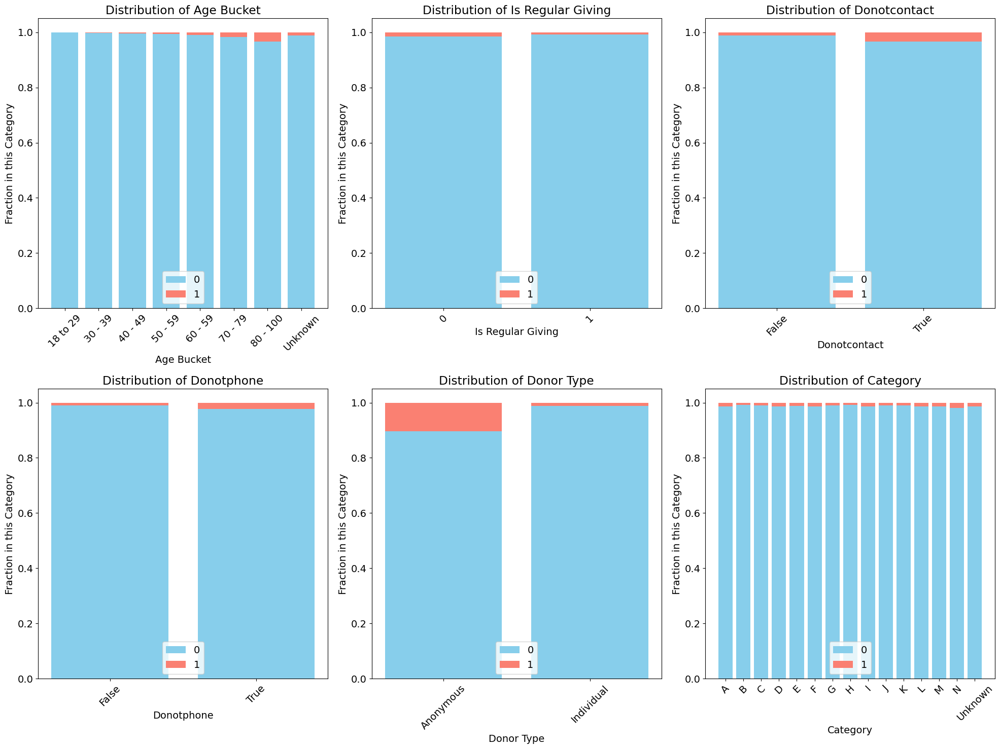

In [137]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import FileLink


DF = merged_df  
Y = DF['y']  
X = ['Age_Bucket', 'is_regular_giving', 'DoNotContact', 'DoNotPhone', 'Donor_Type', 'Category']

plt.figure(figsize=(20, 15))
plt.rcParams.update({'font.size': 14})
width = 0.4

for i, category in enumerate(X):
    plt.subplot(2, 3, i + 1) #subplot for 2x3 = 6

    category_data = pd.crosstab(DF[category], Y, normalize='index')

    # plot stack hist plot
    plt.bar(range(len(category_data)), category_data[0], label='0', color='skyblue')
    plt.bar(range(len(category_data)), category_data[1], bottom=category_data[0], label='1', color='salmon')
    plt.xticks(range(len(category_data)), category_data.index.values, rotation=45)

    # labels
    plt.xlabel(category.replace('_', ' ').title())
    plt.ylabel('Fraction in this Category')
    plt.title(f'Distribution of {category.replace("_", " ").title()}')

    # adding legend
    plt.legend(loc='lower center')

plt.savefig("my_plot.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()

In [138]:
encoded_df = pd.get_dummies(
    encoded_df, 
    columns=['DoNotContact', 'Age_Bucket', 'DoNotPhone', 'DoNotMail', 'DoNotSMS', 
             'DoNotEmail', 'Donor_Type', 'Category'
],  
    drop_first=True
)


In [139]:
encoded_df.corr()

,Month,y,Have_HomePhone,Have_MobilePhone,Have_Email,Mailing_Postcode,Have_WorkPhone,is_regular_giving,donation_history_days,campaign_month,...,Category_F,Category_G,Category_H,Category_I,Category_J,Category_K,Category_L,Category_M,Category_N,Category_Unknown
Month,1.000000,-0.013584,-0.005165,0.039129,0.040246,0.002361,0.040087,0.040265,-0.017677,0.286712,...,0.000037,-0.000174,0.003405,0.004102,0.002262,0.002946,0.001953,-0.001618,-0.000513,0.003438
y,-0.013584,1.000000,0.057589,-0.060580,-0.049295,0.003929,-0.014648,-0.031680,0.086589,0.068264,...,0.002458,-0.007239,-0.004228,0.004168,-0.003173,-0.002637,0.001041,0.001687,0.009303,0.005934
Have_HomePhone,-0.005165,0.057589,1.000000,-0.215913,-0.080338,-0.012104,0.237721,0.144281,0.417002,0.145261,...,-0.001610,-0.012428,-0.032004,0.007574,-0.020793,-0.022592,0.000938,-0.018713,0.028229,0.038554
Have_MobilePhone,0.039129,-0.060580,-0.215913,1.000000,0.481243,-0.016579,0.720694,0.065650,-0.106328,-0.047158,...,0.017031,0.017803,0.013605,-0.020818,-0.006900,0.012352,-0.015792,0.001752,-0.040352,-0.013179
Have_Email,0.040246,-0.049295,-0.080338,0.481243,1.000000,-0.029689,0.443596,0.018221,-0.110535,-0.046866,...,-0.000400,0.017115,-0.002414,-0.015058,-0.001934,0.006792,-0.003710,0.008624,-0.041200,-0.010489
Mailing_Postcode,0.002361,0.003929,-0.012104,-0.016579,-0.029689,1.000000,-0.022859,-0.011622,-0.053826,-0.011824,...,0.189471,-0.076401,0.017900,0.129216,0.015885,0.245718,0.094840,0.049079,0.077699,-0.508651
Have_WorkPhone,0.040087,-0.014648,0.237721,0.720694,0.443596,-0.022859,1.000000,0.075214,0.095479,0.004332,...,0.013463,0.008267,-0.004264,-0.012915,-0.016899,0.000979,-0.019926,0.000128,-0.028973,0.013805
is_regular_giving,0.040265,-0.031680,0.144281,0.065650,0.018221,-0.011622,0.075214,1.000000,0.450601,0.125775,...,0.002140,0.002683,0.000592,-0.009247,-0.009241,-0.014435,0.006130,-0.012189,0.005042,0.022144
donation_history_days,-0.017677,0.086589,0.417002,-0.106328,-0.110535,-0.053826,0.095479,0.450601,1.000000,0.254107,...,-0.010761,-0.015916,-0.042983,-0.017434,-0.055711,-0.039880,-0.017919,-0.013499,0.029028,0.061280
campaign_month,0.286712,0.068264,0.145261,-0.047158,-0.046866,-0.011824,0.004332,0.125775,0.254107,1.000000,...,-0.009398,-0.011236,-0.020129,0.004643,-0.021940,-0.009751,-0.005106,-0.007296,0.009472,0.020442


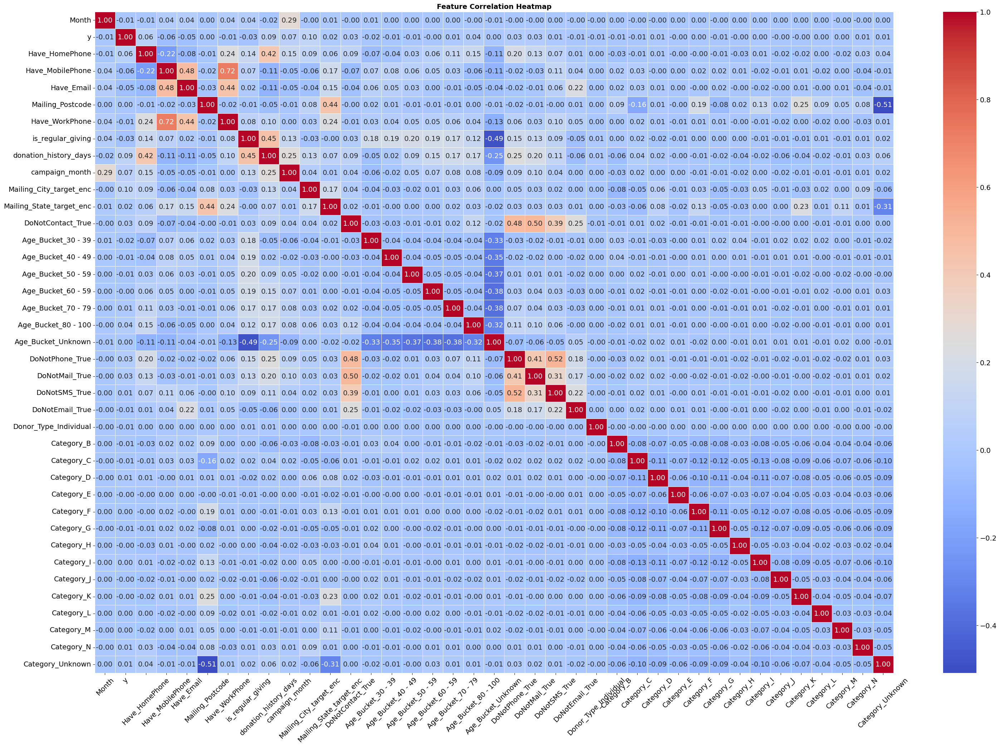

In [140]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the correlation matrix
correlation_matrix = encoded_df.corr()

# Set up the figure
plt.figure(figsize=(36, 24))

# Create the heatmap
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)

# Formatting
plt.title("Feature Correlation Heatmap", fontsize=14, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.savefig("Correlation.png", dpi=300, bbox_inches="tight")
# Show the plot
plt.show()



In [141]:
encoded_df.isnull().sum()


Month                       0
y                           0
Have_HomePhone              0
Have_MobilePhone            0
Have_Email                  0
Mailing_City                0
Mailing_State               0
Mailing_Postcode            0
Have_WorkPhone              0
is_regular_giving           0
donation_history_days       0
campaign_month              0
Mailing_City_target_enc     0
Mailing_State_target_enc    0
DoNotContact_True           0
Age_Bucket_30 - 39          0
Age_Bucket_40 - 49          0
Age_Bucket_50 - 59          0
Age_Bucket_60 - 59          0
Age_Bucket_70 - 79          0
Age_Bucket_80 - 100         0
Age_Bucket_Unknown          0
DoNotPhone_True             0
DoNotMail_True              0
DoNotSMS_True               0
DoNotEmail_True             0
Donor_Type_Individual       0
Category_B                  0
Category_C                  0
Category_D                  0
Category_E                  0
Category_F                  0
Category_G                  0
Category_H

In [142]:
# save as CSV file
encoded_df.to_csv("encoded_df.csv", index=False)


In [143]:
encoded_df = encoded_df.drop(columns=['Mailing_City','Mailing_State'])



## 1.5 Feature Engineerning

In [145]:
# splite x and y
X = encoded_df.drop(['y'], axis=1)
y = encoded_df['y']

In [146]:
# feature importance analysis
from sklearn.feature_selection import mutual_info_classif, SelectKBest

# Select features using mutual information
selector = SelectKBest(score_func=mutual_info_classif, k=15)
selector.fit(X, y)

# Obtain the feature importance score
feature_scores = pd.Series(
    selector.scores_, 
    index=X.columns
).sort_values(ascending=False)

# print
print("Feature Importance Score:")
print(feature_scores)

Feature Importance Score:
Donor_Type_Individual       0.204944
Have_WorkPhone              0.201998
Have_MobilePhone            0.190502
Age_Bucket_Unknown          0.189165
Have_Email                  0.184925
is_regular_giving           0.125267
Month                       0.083130
campaign_month              0.070005
DoNotEmail_True             0.064668
Have_HomePhone              0.038253
DoNotSMS_True               0.017053
donation_history_days       0.011503
Category_C                  0.009157
Category_I                  0.009061
DoNotPhone_True             0.008689
Category_G                  0.007819
DoNotMail_True              0.007685
Category_F                  0.006533
Category_D                  0.005930
Category_Unknown            0.003675
Mailing_City_target_enc     0.003542
Mailing_Postcode            0.003209
Category_K                  0.002650
Category_B                  0.002008
Age_Bucket_70 - 79          0.001613
Age_Bucket_50 - 59          0.001599
Age_Bucket_6

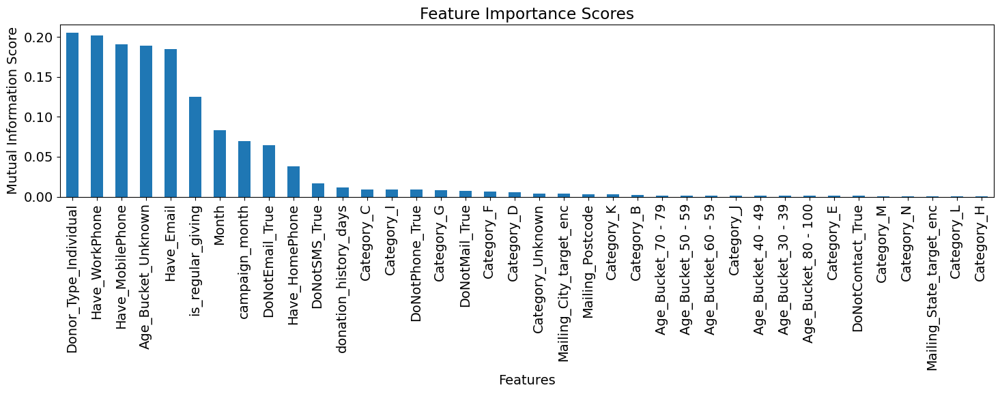

In [147]:
# Visulaize the importance rate
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))
feature_scores.plot(kind='bar')
plt.title('Feature Importance Scores')
plt.xlabel('Features')
plt.ylabel('Mutual Information Score')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [148]:
# selected features
selected_features_mask = selector.get_support()
selected_features = X.columns[selected_features_mask].tolist()

print("\nSelected Features:")
print(selected_features)


Selected Features:
['Month', 'Have_HomePhone', 'Have_MobilePhone', 'Have_Email', 'Have_WorkPhone', 'is_regular_giving', 'donation_history_days', 'campaign_month', 'Age_Bucket_Unknown', 'DoNotPhone_True', 'DoNotSMS_True', 'DoNotEmail_True', 'Donor_Type_Individual', 'Category_C', 'Category_I']


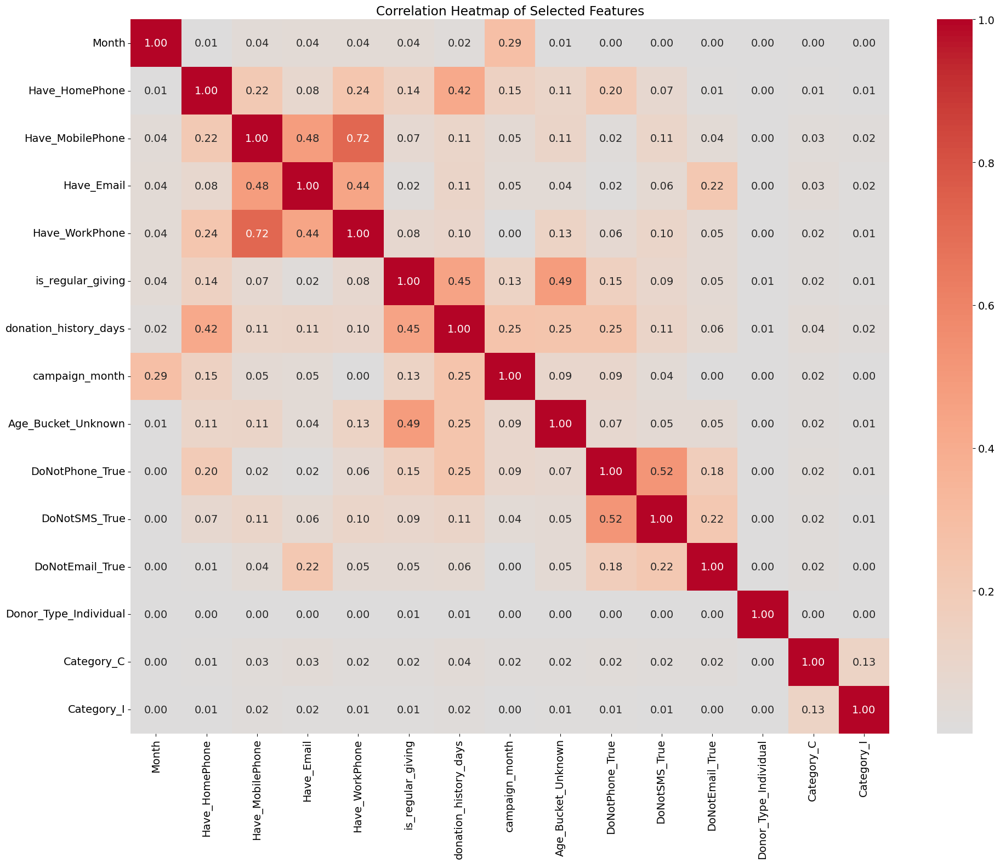


 multicollinearity features gonnna be deleted:
[]


In [149]:
# Multicollinearity
import numpy as np
import seaborn as sns

# correlation matrix
corr_matrix = X[selected_features].corr().abs()

# visual the matrix
plt.figure(figsize=(20, 16))
sns.heatmap(
    corr_matrix, 
    annot=True, 
    cmap='coolwarm', 
    center=0,
    fmt='.2f'
)
plt.title('Correlation Heatmap of Selected Features')
plt.tight_layout()
plt.show()

# find the high correlation features
def find_high_correlation_features(corr_matrix, threshold=0.8):
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    return to_drop

# multicollinearity features gonnna be deleted
multicollinearity_features = find_high_correlation_features(corr_matrix)

print("\n multicollinearity features gonnna be deleted:")
print(multicollinearity_features)


In [150]:

# final selected features
final_features = [f for f in selected_features if f not in multicollinearity_features]

print("\n Final Selected Features:")
print(final_features)


 Final Selected Features:
['Month', 'Have_HomePhone', 'Have_MobilePhone', 'Have_Email', 'Have_WorkPhone', 'is_regular_giving', 'donation_history_days', 'campaign_month', 'Age_Bucket_Unknown', 'DoNotPhone_True', 'DoNotSMS_True', 'DoNotEmail_True', 'Donor_Type_Individual', 'Category_C', 'Category_I']


In [151]:
encoded_df.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2926759 entries, 0 to 2926758
Data columns (total 39 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   Month                     int64  
 1   y                         int64  
 2   Have_HomePhone            int64  
 3   Have_MobilePhone          int64  
 4   Have_Email                int64  
 5   Mailing_Postcode          Int64  
 6   Have_WorkPhone            int64  
 7   is_regular_giving         int64  
 8   donation_history_days     int64  
 9   campaign_month            int64  
 10  Mailing_City_target_enc   float64
 11  Mailing_State_target_enc  float64
 12  DoNotContact_True         uint8  
 13  Age_Bucket_30 - 39        uint8  
 14  Age_Bucket_40 - 49        uint8  
 15  Age_Bucket_50 - 59        uint8  
 16  Age_Bucket_60 - 59        uint8  
 17  Age_Bucket_70 - 79        uint8  
 18  Age_Bucket_80 - 100       uint8  
 19  Age_Bucket_Unknown        uint8  
 20  DoNotPhone_True         

# Modeling

In [153]:
import pandas as pd
import numpy as np

# Separate the features from the target variables
X = encoded_df[final_features]
y = encoded_df['y']

# Data Splite
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(
    X, y, 
    test_size=0.2,  # 20% test data
    random_state=42,  # random seed = 42
    stratify=y  # Stratified sampling and maintaining the proportion of categories
)

# print the train and test shape
print("\n size of train:", X_train.shape)
print("size of test:", X_test.shape)


 size of train: (2341407, 15)
size of test: (585352, 15)


In [154]:
x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, test_size=0.2, random_state=42)
print("\n size of train:", x_train.shape)
print("size of validation:", x_val.shape)


 size of train: (1873125, 15)
size of validation: (468282, 15)


## Model 1 Random Forest


 current parameters:

 current parameters:

 current parameters:

 current parameters:

 current parameters:

 current parameters:

 current parameters:

 current parameters:

 Best Hyper:
n_estimators: 200
max_depth: 15
class_weight: balanced
accuracy: 0.85383166553487
auc: 0.90219945863925
pr_auc: 0.13039669193112452
time: 161.4868288040161

 Preformence of Final Model:
Accuracy: 0.8538
AUC: 0.9022
PR AUC: 0.1304
F1 Score: 0.1099


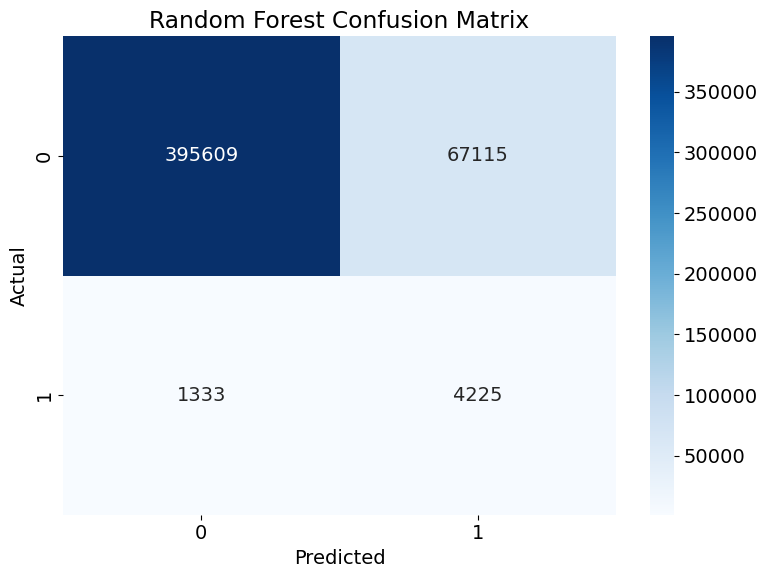

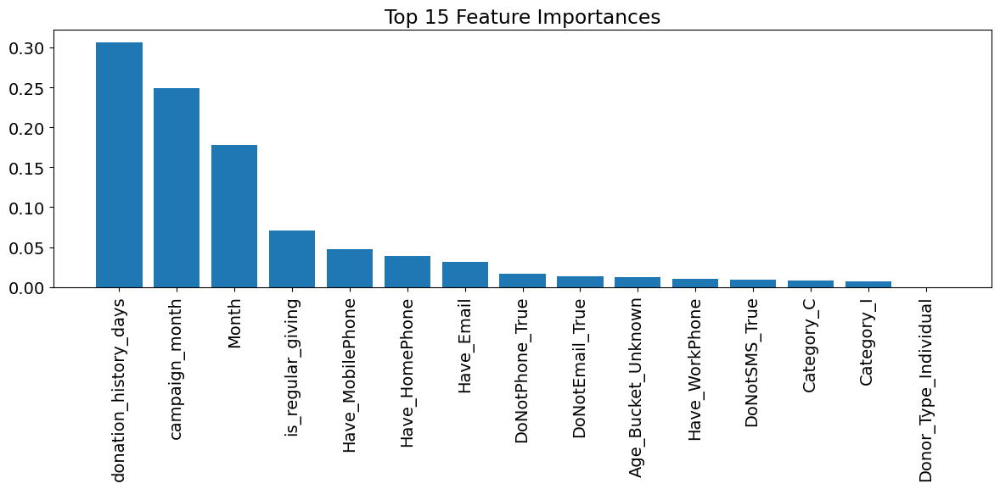

In [156]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.metrics import f1_score
from scipy.stats import randint, uniform
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, 
    roc_auc_score, 
    confusion_matrix,
    average_precision_score,
    classification_report
)

# Define the combination of hyperparameters to be searched
hyperparameters = {
    'n_estimators': [100, 200],
    'max_depth': [15, 20],
    'class_weight': ['balanced', 'balanced_subsample']
}

# A list of stored results
results = []

# grid search
for n_est in hyperparameters['n_estimators']:
    for max_d in hyperparameters['max_depth']:
        for class_w in hyperparameters['class_weight']:
            # print the hyper
            print(f"\n current parameters:")
            # print(f"n_estimators: {n_est}")
            # print(f"max_depth: {max_d}")
            # print(f"class_weight: {class_w}")
            
            # time counting 
            start_time = time.time()
            
            # initial the model
            rf_model = RandomForestClassifier(
                n_estimators=n_est, 
                max_depth=max_d,
                class_weight=class_w,
                random_state=42
            )
            rf_model.fit(x_train, y_train)
            
            # prediction
            y_pred_rf = rf_model.predict(x_val)
            y_prob_rf = rf_model.predict_proba(x_val)[:, 1]
            
            # calculate the evaluation score
            accuracy = accuracy_score(y_val, y_pred_rf)
            auc = roc_auc_score(y_val, y_prob_rf)
            pr_auc = average_precision_score(y_val, y_prob_rf)
            
            # end counting
            end_time = time.time()
            
            # total calculating time
            total_time = end_time - start_time
            
            # save the result
            result = {
                'n_estimators': n_est,
                'max_depth': max_d,
                'class_weight': class_w,
                'accuracy': accuracy,
                'auc': auc,
                'pr_auc': pr_auc,
                'time': total_time
            }
            results.append(result)
            

# sort by AUC
results_sorted = sorted(results, key=lambda x: x['auc'], reverse=True)

# print the best hyper
print("\n Best Hyper:")
best_result = results_sorted[0]
for key, value in best_result.items():
    print(f"{key}: {value}")

# Visualization of Feature Importance
def plot_feature_importance(model, feature_names):
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    plt.figure(figsize=(12, 6))
    plt.title("Top 15 Feature Importances")
    plt.bar(range(15), importances[indices][:15])
    plt.xticks(range(15), [feature_names[i] for i in indices][:15], rotation=90)
    plt.tight_layout()
    plt.show()

# Retrain the model using the best parameters
best_rf_model = RandomForestClassifier(
    n_estimators=best_result['n_estimators'],
    max_depth=best_result['max_depth'],
    class_weight=best_result['class_weight'],
    random_state=42
)
best_rf_model.fit(x_train, y_train)

# prediction
best_y_pred_rf = best_rf_model.predict(x_val)
best_y_prob_rf = best_rf_model.predict_proba(x_val)[:, 1]

# Calculate the final indicators
best_accuracy = accuracy_score(y_val, best_y_pred_rf)
best_auc = roc_auc_score(y_val, best_y_prob_rf)
best_pr_auc = average_precision_score(y_val, best_y_prob_rf)
best_f1 = f1_score(y_val, best_y_pred_rf)

print("\n Preformence of Final Model:")
print(f"Accuracy: {best_accuracy:.4f}")
print(f"AUC: {best_auc:.4f}")
print(f"PR AUC: {best_pr_auc:.4f}")
print(f"F1 Score: {best_f1:.4f}")

# Visual confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val, best_y_pred_rf)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# Draw the importance of features
plot_feature_importance(best_rf_model, x_train.columns)

## Model 2 XGBoost

Positive Negetive Ratio (scale_pos_weight): 80.88

 Best Hyperparameter:
n_estimators: 200
max_depth: 10
learning_rate: 0.1
scale_pos_weight: 80.87808716177821
accuracy: 0.8562255222280591
auc: 0.9179051686522546
pr_auc: 0.17538359669370351
time: 8.003453969955444

 Preformence of The Model:
Accuracy: 0.8562
ROC AUC: 0.9179
PR AUC: 0.1754
F1 Score: 0.1163


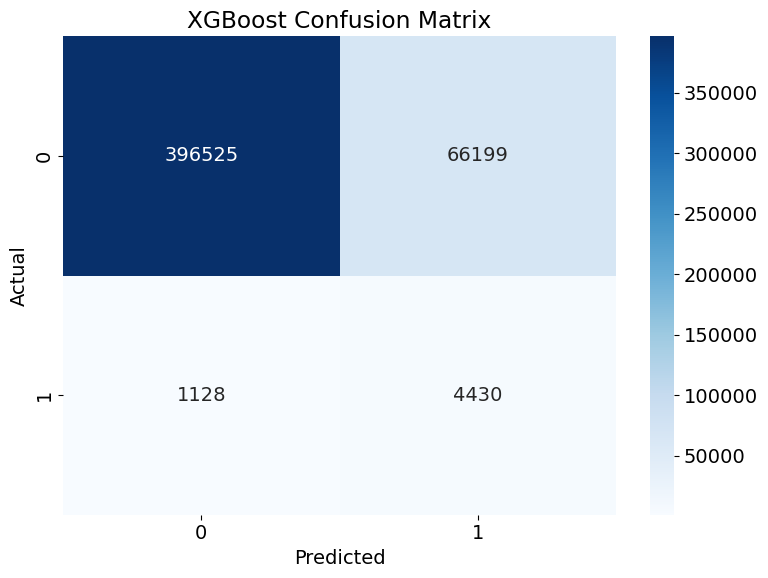

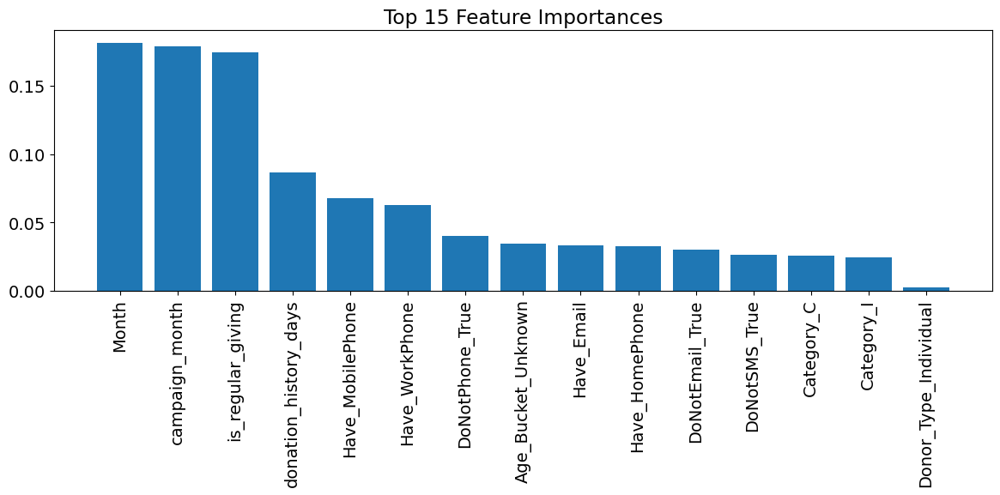

In [158]:
import xgboost as xgb
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.metrics import (
    accuracy_score, 
    roc_auc_score, 
    confusion_matrix, 
    classification_report, 
    precision_recall_curve,
    average_precision_score
)

# Calculate the ratio of positive and negative classes
pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1])
print(f"Positive Negetive Ratio (scale_pos_weight): {pos_weight:.2f}")

# Define the combination of hyperparameters to be searched
hyperparameters = {
    'n_estimators': [100, 200],
    'max_depth': [5,10, 15],
    'scale_pos_weight': [pos_weight, pos_weight*2],
    'learning_rate': [0.1]
}

# save the result
results = []

# grid search
for n_est in hyperparameters['n_estimators']:
    for max_d in hyperparameters['max_depth']:
        for scale_pos in hyperparameters['scale_pos_weight']:
            for learn_rate in hyperparameters['learning_rate']:
                start_time = time.time()
                
                # initial and training the model
                xgb_model = xgb.XGBClassifier(
                    n_estimators=n_est, 
                    max_depth=max_d,
                    learning_rate=learn_rate,
                    scale_pos_weight=scale_pos,
                    random_state=42
                )
                xgb_model.fit(x_train, y_train)
                
                # predicition
                y_pred_xgb = xgb_model.predict(x_val)
                y_prob_xgb = xgb_model.predict_proba(x_val)[:, 1]
                
                # calculate the AUC
                accuracy = accuracy_score(y_val, y_pred_xgb)
                auc = roc_auc_score(y_val, y_prob_xgb)
                
                end_time = time.time()

                total_time = end_time - start_time
                
                # Calculate area under Precision-Recall
                pr_auc = average_precision_score(y_val, y_prob_xgb)
                
                # save result
                result = {
                    'n_estimators': n_est,
                    'max_depth': max_d,
                    'learning_rate': learn_rate,
                    'scale_pos_weight': scale_pos,
                    'accuracy': accuracy,
                    'auc': auc,
                    'pr_auc': pr_auc,
                    'time': total_time
                }
                results.append(result)
                


# sore by PR AUC
results_sorted = sorted(results, key=lambda x: x['pr_auc'], reverse=True)

# print the best hyperparameter
print("\n Best Hyperparameter:")
best_result = results_sorted[0]
for key, value in best_result.items():
    print(f"{key}: {value}")

# Feature importance visualization
def plot_feature_importance(model, feature_names):
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    plt.figure(figsize=(12, 6))
    plt.title("Top 15 Feature Importances")
    plt.bar(range(15), importances[indices][:15])
    plt.xticks(range(15), [feature_names[i] for i in indices][:15], rotation=90)
    plt.tight_layout()
    plt.show()

# using the best hyper to train the model
best_xgb_model = xgb.XGBClassifier(
    n_estimators=best_result['n_estimators'],
    max_depth=best_result['max_depth'],
    learning_rate=best_result['learning_rate'],
    scale_pos_weight=best_result['scale_pos_weight'],
    random_state=42
)
best_xgb_model.fit(x_train, y_train)

# prediction
best_y_pred_xgb = best_xgb_model.predict(x_val)
best_y_prob_xgb = best_xgb_model.predict_proba(x_val)[:, 1]

# calculate the final indicator
best_accuracy = accuracy_score(y_val, best_y_pred_xgb)
best_auc = roc_auc_score(y_val, best_y_prob_xgb)
best_pr_auc = average_precision_score(y_val, best_y_prob_xgb)
best_f1_xgb = f1_score(y_val, best_y_pred_xgb)

print("\n Preformence of The Model:")
print(f"Accuracy: {best_accuracy:.4f}")
print(f"ROC AUC: {best_auc:.4f}")
print(f"PR AUC: {best_pr_auc:.4f}")
print(f"F1 Score: {best_f1_xgb:.4f}")

# Visual the Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val, best_y_pred_xgb)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("XGBoost Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# Plot the Fearutre importance 
plot_feature_importance(best_xgb_model, x_train.columns)

## Model 3 Gradient Boosting

Positive and Negative Ratio: 80.88

 best combination of hyper:
n_estimators: 200
max_depth: 5
learning_rate: 0.1
subsample: 0.8
accuracy: 0.8078807214456246
auc: 0.9162844358587597
pr_auc: -0.1360046176262709
time: 332.7066731452942

Final Preformance of Model:
Accuracy: 0.8079
ROC AUC: 0.9163
PR AUC: 0.1361
F1 Score: 0.0964


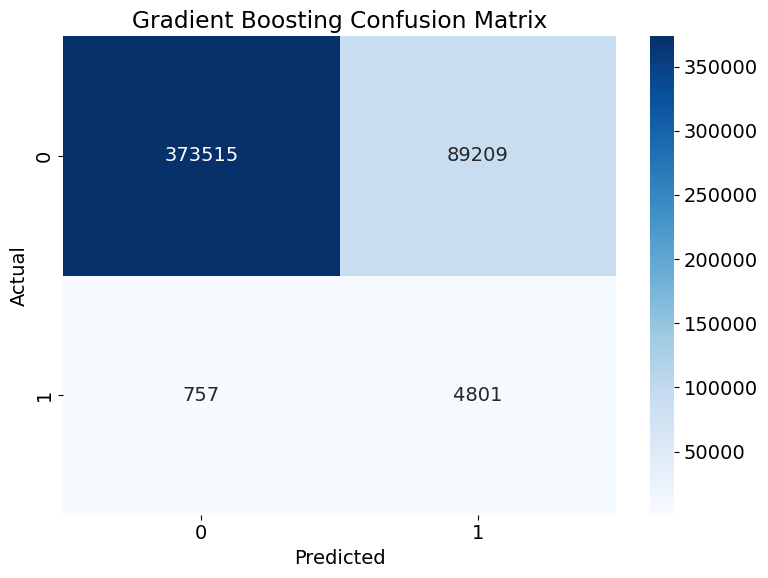

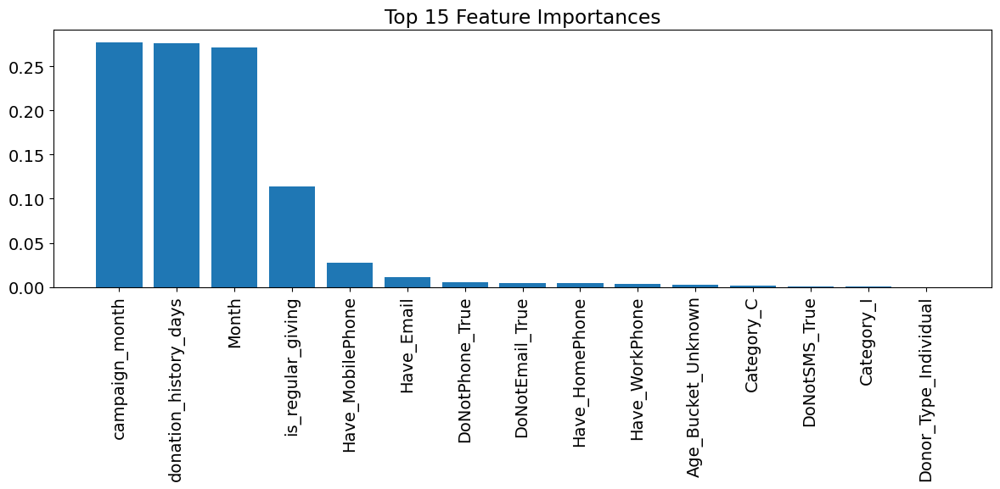

In [160]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score, 
    roc_auc_score, 
    confusion_matrix, 
    classification_report, 
    average_precision_score,
    precision_recall_curve
)

# # Calculate the ratio of positive and negative classes
pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1])
print(f"Positive and Negative Ratio: {pos_weight:.2f}")

# calculate the weights of class
class_weights = compute_class_weight(
    class_weight='balanced', 
    classes=np.unique(y_train), 
    y=y_train
)

# creating the sample weights
sample_weights = np.ones(shape=len(y_train))
sample_weights[y_train == 1] = class_weights[1]
sample_weights[y_train == 0] = class_weights[0]

# hyperparameters
hyperparameters = {
    'n_estimators': [200, 300],  
    'max_depth': [5, 10], 
    'learning_rate': [0.1], 
    'subsample': [0.8, 1.0]
}

# save the result
results = []

# grid search
for n_est in hyperparameters['n_estimators']:
    for max_d in hyperparameters['max_depth']:
        for learn_rate in hyperparameters['learning_rate']:
            for subsample in hyperparameters['subsample']:

                start_time = time.time()
                    
                # initial the training model
                gb_model = GradientBoostingClassifier(
                    n_estimators=n_est, 
                    max_depth=max_d,
                    learning_rate=learn_rate,
                    subsample=subsample,
                    random_state=42
                )
                    
                # using the sample weight
                gb_model.fit(x_train, y_train, sample_weight=sample_weights)
                
                # prediction
                y_pred_gb = gb_model.predict(x_val)                    
                y_prob_gb = gb_model.predict_proba(x_val)[:, 1]
                
                # calculate the AUC
                accuracy = accuracy_score(y_val, y_pred_gb)
                auc = roc_auc_score(y_val, y_prob_gb)
                                    # 结束计时
                end_time = time.time()
                
            
                total_time = end_time - start_time                    
                 # Calculate are under Precision-Recall
                precision, recall, _ = precision_recall_curve(y_val, y_prob_gb)
                pr_auc = np.trapz(precision, recall)
                    
                # save the result
                result = {
                    'n_estimators': n_est,
                    'max_depth': max_d,
                    'learning_rate': learn_rate,
                    'subsample': subsample,
                    'accuracy': accuracy,
                    'auc': auc,
                    'pr_auc': pr_auc,
                    'time': total_time
                }
                results.append(result)
                    
            

# sort by PR AUC
results_sorted = sorted(results, key=lambda x: x['pr_auc'], reverse=True)


print("\n best combination of hyper:")
best_result = results_sorted[0]
for key, value in best_result.items():
    print(f"{key}: {value}")

# visualize the feature importance
def plot_feature_importance(model, feature_names):
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    plt.figure(figsize=(12, 6))
    plt.title("Top 15 Feature Importances")
    plt.bar(range(15), importances[indices][:15])
    plt.xticks(range(15), [feature_names[i] for i in indices][:15], rotation=90)
    plt.tight_layout()
    plt.show()

# using the best hpyer to train the model
best_gb_model = GradientBoostingClassifier(
    n_estimators=best_result['n_estimators'],
    max_depth=best_result['max_depth'],
    learning_rate=best_result['learning_rate'],
    subsample=best_result['subsample'],
    random_state=42
)
best_gb_model.fit(x_train, y_train, sample_weight=sample_weights)

# prediction
best_y_pred_gb = best_gb_model.predict(x_val)
best_y_prob_gb = best_gb_model.predict_proba(x_val)[:, 1]

# calculate the indicator
best_accuracy = accuracy_score(y_val, best_y_pred_gb)
best_auc = roc_auc_score(y_val, best_y_prob_gb)
best_pr_auc = average_precision_score(y_val, best_y_prob_gb)
best_f1_gb = f1_score(y_val, best_y_pred_gb)

print("\nFinal Preformance of Model:")
print(f"Accuracy: {best_accuracy:.4f}")
print(f"ROC AUC: {best_auc:.4f}")
print(f"PR AUC: {best_pr_auc:.4f}")
print(f"F1 Score: {best_f1_gb:.4f}")

# Visualize the Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val, best_y_pred_gb)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Gradient Boosting Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# plot the feature importance
plot_feature_importance(best_gb_model, x_train.columns)



In [161]:
print("y_val classes:", np.unique(y_val))
print("Probabilities range:", best_y_prob_gb.min(), best_y_prob_gb.max())

best_pr_auc = average_precision_score(y_val, best_y_prob_gb)
print("PR AUC (average precision):", best_pr_auc)

y_val classes: [0 1]
Probabilities range: 0.00020073538079173046 0.9851505647601724
PR AUC (average precision): 0.1360731886142329


## Model 4 LightGBM

Positive and Negative Ratio: 80.88

 Best Hyper Combination:
n_estimators: 300
max_depth: 10
learning_rate: 0.1
num_leaves: 127
min_child_samples: 25
accuracy: 0.8417022221652765
auc: 0.9198047695244763
pr_auc: 0.17002681695603317
time: 17.338619232177734

Preformance of the Final Model:
Accuracy: 0.8417
ROC AUC: 0.9198
PR AUC: 0.1700
F1 Score: 0.1099


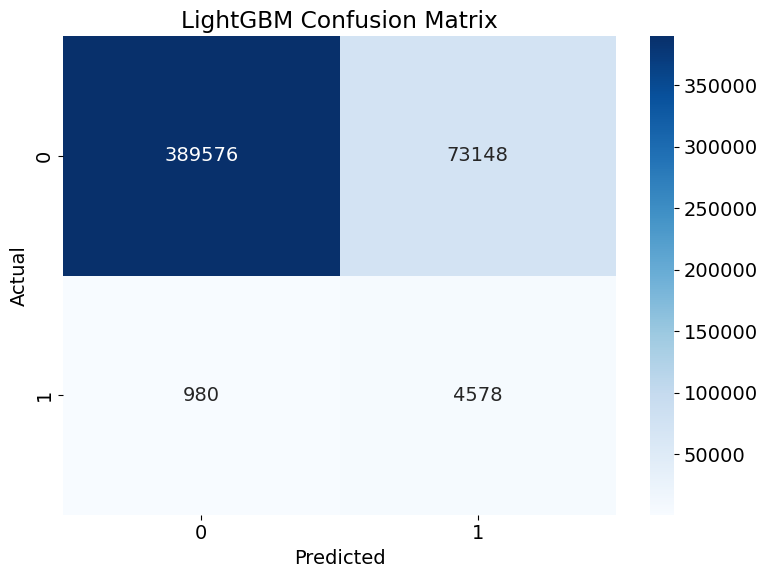

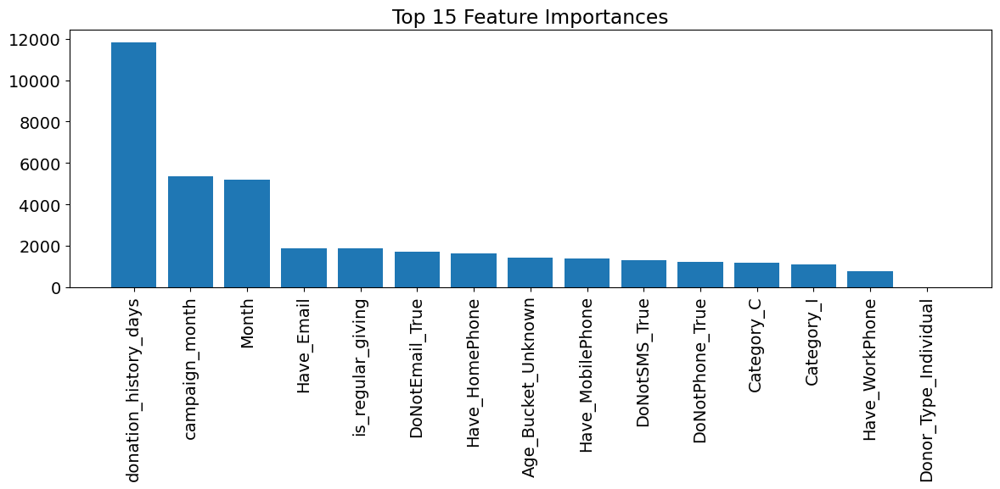

In [163]:
import lightgbm as lgb
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.metrics import (
    accuracy_score, 
    roc_auc_score, 
    confusion_matrix, 
    classification_report, 
    average_precision_score
)

# Rator of postive and negetive
pos_weight = len(y_train[y_train==0]) / len(y_train[y_train==1])
print(f"Positive and Negative Ratio: {pos_weight:.2f}")

# Optimization of hyper
hyperparameters = {
    'n_estimators': [200, 300], 
    'max_depth': [5, 10], 
    'learning_rate': [0.05, 0.1], 
    'num_leaves': [63, 127], 
    'min_child_samples': [25,50] 
}

# save the result
results = []

# Grid Search
for n_est in hyperparameters['n_estimators']:
    for max_d in hyperparameters['max_depth']:
        for learn_rate in hyperparameters['learning_rate']:
            for num_leaves in hyperparameters['num_leaves']:
                for min_child in hyperparameters['min_child_samples']:
                    
                    start_time = time.time()
                    
                    # initial and training model
                    lgb_model = lgb.LGBMClassifier(
                        n_estimators=n_est, 
                        max_depth=max_d,
                        learning_rate=learn_rate,
                        num_leaves=num_leaves,
                        min_child_samples=min_child,
                        is_unbalance=True, 
                        random_state=42,
                        verbose=-1 

                    )
                    lgb_model.fit(x_train, y_train)
                    
                    # prediction
                    y_pred_lgb = lgb_model.predict(x_val)
                    y_prob_lgb = lgb_model.predict_proba(x_val)[:, 1]
                    
                    # Calculate the indicator
                    accuracy = accuracy_score(y_val, y_pred_lgb)
                    auc = roc_auc_score(y_val, y_prob_lgb)
                    
                    
                    end_time = time.time()
                    
                    total_time = end_time - start_time
                    
                    # Calculate the area under Precision-Recall
                    pr_auc = average_precision_score(y_val, y_prob_lgb)
                    
                    # save the result
                    result = {
                        'n_estimators': n_est,
                        'max_depth': max_d,
                        'learning_rate': learn_rate,
                        'num_leaves': num_leaves,
                        'min_child_samples': min_child,
                        'accuracy': accuracy,
                        'auc': auc,
                        'pr_auc': pr_auc,
                        'time': total_time
                    }
                    results.append(result)
                    
            

# Sort by PR AUC
results_sorted = sorted(results, key=lambda x: x['pr_auc'], reverse=True)

# print the best hyper
print("\n Best Hyper Combination:")
best_result = results_sorted[0]
for key, value in best_result.items():
    print(f"{key}: {value}")

# Feature importance Visualization
def plot_feature_importance(model, feature_names):
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    plt.figure(figsize=(12, 6))
    plt.title("Top 15 Feature Importances")
    plt.bar(range(15), importances[indices][:15])
    plt.xticks(range(15), [feature_names[i] for i in indices][:15], rotation=90)
    plt.tight_layout()
    plt.show()

# using the best hyper to train the model
best_lgb_model = lgb.LGBMClassifier(
    n_estimators=best_result['n_estimators'],
    max_depth=best_result['max_depth'],
    learning_rate=best_result['learning_rate'],
    num_leaves=best_result['num_leaves'],
    min_child_samples=best_result['min_child_samples'],
    is_unbalance=True,
    random_state=42
)
best_lgb_model.fit(x_train, y_train)

# prediction
best_y_pred_lgb = best_lgb_model.predict(x_val)
best_y_prob_lgb = best_lgb_model.predict_proba(x_val)[:, 1]

# Calculate the indicator
best_accuracy = accuracy_score(y_val, best_y_pred_lgb)
best_auc = roc_auc_score(y_val, best_y_prob_lgb)
best_pr_auc = average_precision_score(y_val, best_y_prob_lgb)
best_f1_lgb = f1_score(y_val, best_y_pred_lgb)


print("\nPreformance of the Final Model:")
print(f"Accuracy: {best_accuracy:.4f}")
print(f"ROC AUC: {best_auc:.4f}")
print(f"PR AUC: {best_pr_auc:.4f}")
print(f"F1 Score: {best_f1_lgb:.4f}")
# Visulaization of Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_val, best_y_pred_lgb)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("LightGBM Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# Plot the Feature importance
plot_feature_importance(best_lgb_model, x_train.columns)


# Final Model

Ratio of Positive and Negetive (scale_pos_weight): 81.34

 Best Hyper Combination:
n_estimators: 200
max_depth: 10
learning_rate: 0.1
scale_pos_weight: 81.34243010374539
accuracy: 0.8542142164031216
auc: 0.9245447911420789
pr_auc: 0.19098181204249767
time: 9.447293996810913

 Final Preformence of Model:
Accuracy: 0.8542
ROC AUC: 0.9245
PR AUC: 0.1910
F1 Score: 0.1199


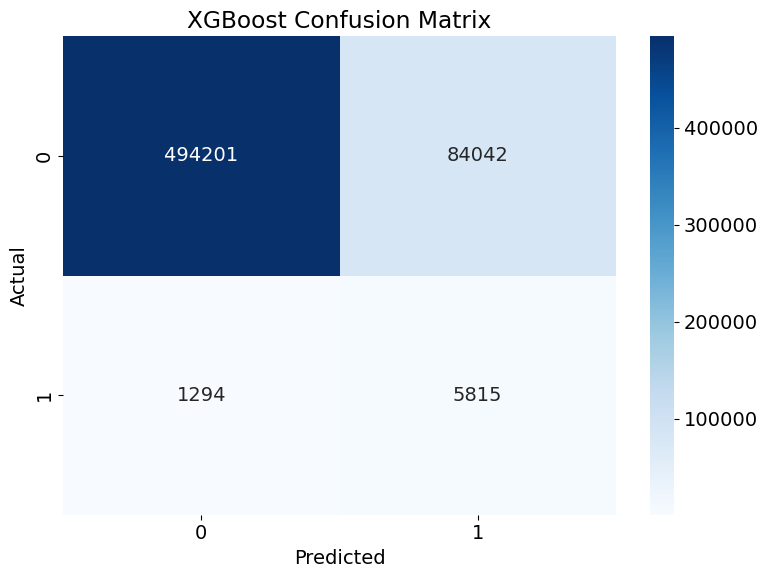

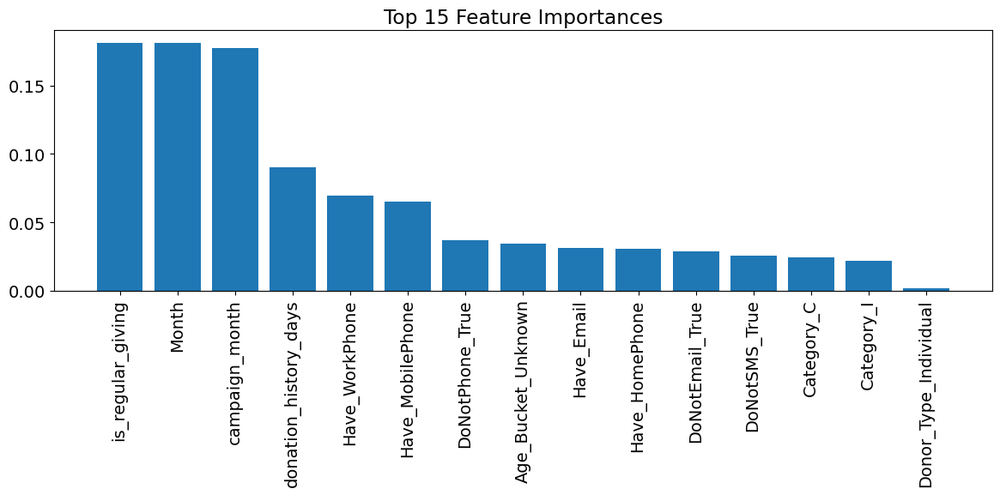

In [165]:
import xgboost as xgb
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.metrics import (
    accuracy_score, 
    roc_auc_score, 
    confusion_matrix, 
    classification_report, 
    precision_recall_curve,
    average_precision_score
)

# Ratio of Pos and Neg
pos_weight = len(Y_train[Y_train==0]) / len(Y_train[Y_train==1])
print(f"Ratio of Positive and Negetive (scale_pos_weight): {pos_weight:.2f}")

# optimize of Hyper
hyperparameters = {
    'n_estimators': [100, 200],
    'max_depth': [5,10, 15],
    'scale_pos_weight': [pos_weight, pos_weight*2],
    'learning_rate': [0.1]
}

# save the result
results = []

# grid search
for n_est in hyperparameters['n_estimators']:
    for max_d in hyperparameters['max_depth']:
        for scale_pos in hyperparameters['scale_pos_weight']:
            for learn_rate in hyperparameters['learning_rate']:
                
                start_time = time.time()
                
                # initial and training model
                xgb_model = xgb.XGBClassifier(
                    n_estimators=n_est, 
                    max_depth=max_d,
                    learning_rate=learn_rate,
                    scale_pos_weight=scale_pos,
                    random_state=42
                )
                xgb_model.fit(X_train, Y_train)
                
                # prediction
                y_pred_xgb = xgb_model.predict(X_test)
                y_prob_xgb = xgb_model.predict_proba(X_test)[:, 1]
                
                # calculate the indicators
                accuracy = accuracy_score(Y_test, y_pred_xgb)
                auc = roc_auc_score(Y_test, y_prob_xgb)
                
                
                end_time = time.time()
                total_time = end_time - start_time
                
                # Calculate the area under Precision-Recall
                pr_auc = average_precision_score(Y_test, y_prob_xgb)
                
                # save the result
                result = {
                    'n_estimators': n_est,
                    'max_depth': max_d,
                    'learning_rate': learn_rate,
                    'scale_pos_weight': scale_pos,
                    'accuracy': accuracy,
                    'auc': auc,
                    'pr_auc': pr_auc,
                    'time': total_time
                }
                results.append(result)
                
  
# sort by PR AUC
results_sorted = sorted(results, key=lambda x: x['pr_auc'], reverse=True)

# print the best hyper
print("\n Best Hyper Combination:")
best_result = results_sorted[0]
for key, value in best_result.items():
    print(f"{key}: {value}")

# Feature Importance Visualization
def plot_feature_importance(model, feature_names):
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    plt.figure(figsize=(12, 6))
    plt.title("Top 15 Feature Importances")
    plt.bar(range(15), importances[indices][:15])
    plt.xticks(range(15), [feature_names[i] for i in indices][:15], rotation=90)
    plt.tight_layout()
    plt.show()

# Using the best hyper to fit the model
best_xgb_model = xgb.XGBClassifier(
    n_estimators=best_result['n_estimators'],
    max_depth=best_result['max_depth'],
    learning_rate=best_result['learning_rate'],
    scale_pos_weight=best_result['scale_pos_weight'],
    random_state=42
)
best_xgb_model.fit(X_train, Y_train)

# prediction
best_y_pred_xgb = best_xgb_model.predict(X_test)
best_y_prob_xgb = best_xgb_model.predict_proba(X_test)[:, 1]

# Calculate Final indicator
best_accuracy = accuracy_score(Y_test, best_y_pred_xgb)
best_auc = roc_auc_score(Y_test, best_y_prob_xgb)
best_pr_auc = average_precision_score(Y_test, best_y_prob_xgb)
best_f1_xgb_final = f1_score(Y_test, best_y_pred_xgb)

print("\n Final Preformence of Model:")
print(f"Accuracy: {best_accuracy:.4f}")
print(f"ROC AUC: {best_auc:.4f}")
print(f"PR AUC: {best_pr_auc:.4f}")
print(f"F1 Score: {best_f1_xgb_final:.4f}")
# Plot the matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(Y_test, best_y_pred_xgb)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("XGBoost Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

plot_feature_importance(best_xgb_model, X_train.columns)

100%|===================| 585316/585352 [200:07<00:00]         

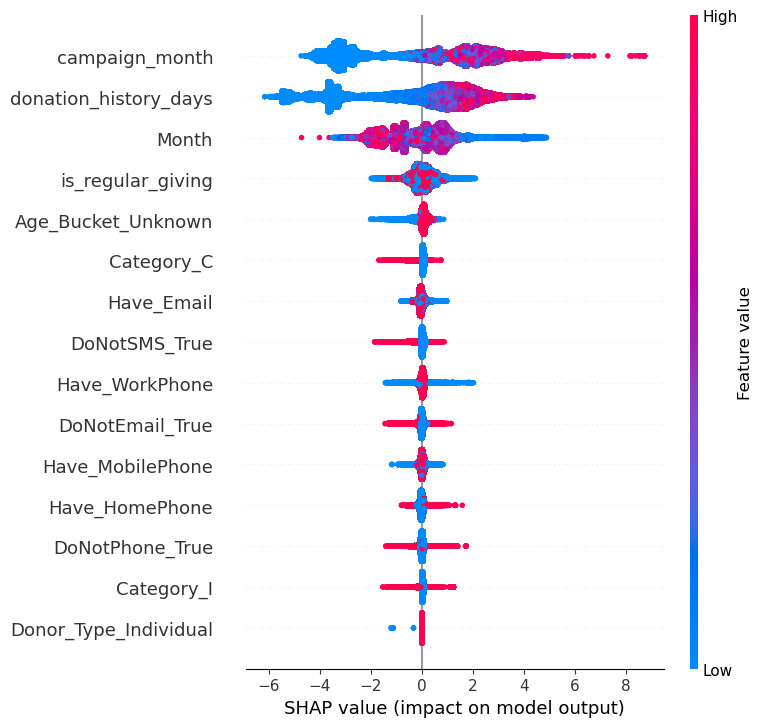

In [166]:
import shap

# SHAP
explainer = shap.Explainer(best_xgb_model, X_test)
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test)

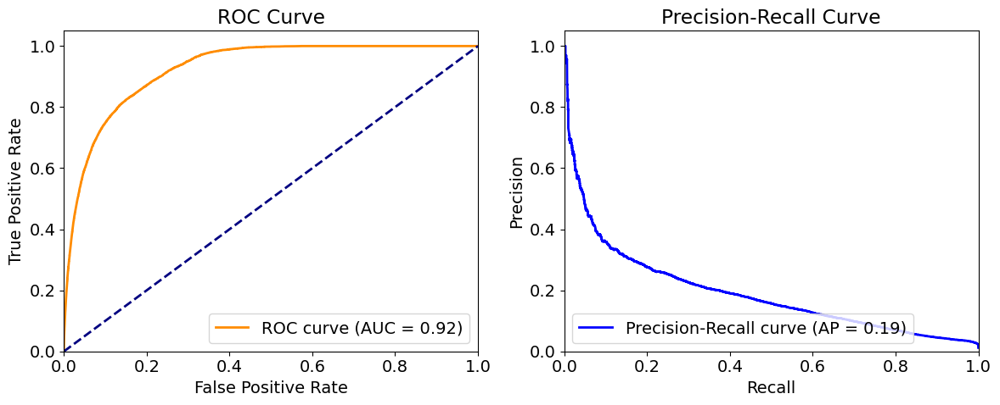

In [167]:
# ROC and Precision-Recall curves
from sklearn.metrics import roc_curve, precision_recall_curve

# Create figure
plt.figure(figsize=(12, 5))

# ROC Curve
plt.subplot(1, 2, 1)
fpr, tpr, roc_thresholds = roc_curve(Y_test, best_y_prob_xgb)
roc_auc = roc_auc_score(Y_test, best_y_prob_xgb)

plt.plot(fpr, tpr, color='darkorange', lw=2, 
         label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")

# Precision-Recall Curve
plt.subplot(1, 2, 2)
precision, recall, pr_thresholds = precision_recall_curve(Y_test, best_y_prob_xgb)
average_precision = average_precision_score(Y_test, best_y_prob_xgb)

plt.plot(recall, precision, color='blue', lw=2, 
         label=f'Precision-Recall curve (AP = {average_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.tight_layout()
plt.show()

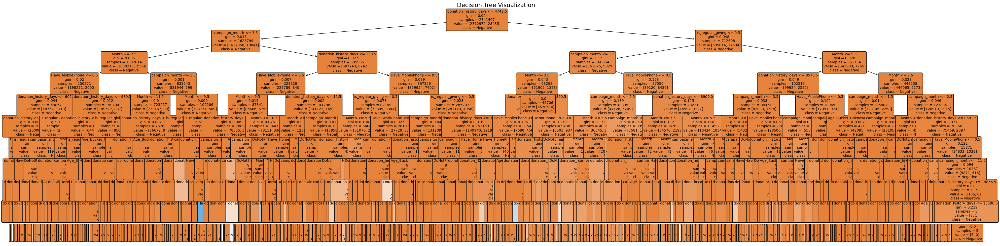

In [168]:
# Sklearn Decision Tree Visualization
from sklearn.tree import plot_tree, export_text
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

def convert_xgboost_to_sklearn_tree(xgb_model, X_train):
    sk_tree = DecisionTreeClassifier(
        max_depth=xgb_model.max_depth,
        random_state=42
    )
    
    sk_tree.fit(X_train, Y_train)
    
    return sk_tree

sklearn_tree = convert_xgboost_to_sklearn_tree(best_xgb_model, X_train)

plt.figure(figsize=(40, 10))
plot_tree(sklearn_tree, 
          feature_names=list(X_train.columns), 
          class_names=['Negative', 'Positive'],
          filled=True,
          rounded=True,
          fontsize=10)

plt.title("Decision Tree Visualization")
plt.tight_layout()
plt.show()

